In [73]:
import pandas as pd
import yfinance as yf
import statsmodels.api as sm
from matplotlib import pyplot as plt
regime_data = pd.read_parquet('macro_regime_test_fed_no_groups.parquet')
combined_df = pd.read_excel('features.xlsx',index_col=0)

In [74]:
combined_df

,Total DUC,Total US RigCount,U.S. Product Supplied of Crude Oil (Thousand Barrels per Day),U.S. Crude Oil Proved Reserves (Million Barrels),U.S. Field Production of Crude Oil (Thousand Barrels),Crude oil including lease condensate production,"Petroleum and other liquids production, Mexico (thousand barrels per day)",Total Imports,Africa_Imports,Asia_Imports,...,WCS_Diff,Lloyd_Diff,importbyareatotal,exportbyareatotal,inventorysum,capasum_x,capasum_y,futurecrudeoil,combinecrudeoil,futureheatoil
Date,,,,,,,,,,,,,,,,,,,,,
1960-01-31,NaN,NaN,NaN,31719,224140,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-02-29,NaN,NaN,NaN,31719,209986,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-03-31,NaN,NaN,NaN,31719,220977,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-04-30,NaN,NaN,NaN,31719,211132,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-05-31,NaN,NaN,NaN,31719,212296,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-30,9350.0,623.0,0.0,41151,397397,3893.0,2028.0,257243.0,11988.0,38743.0,...,73.85,54.88,556032.0,619900.0,6153649.0,42859.0,53844.2,4118580.0,6360005.0,905725.0
2023-10-31,9108.0,625.0,0.0,41151,409944,3893.0,2028.0,244677.0,11089.0,32166.0,...,67.23,54.88,556032.0,619900.0,6153649.0,42859.0,53844.2,4118580.0,6360005.0,905725.0
2023-11-30,8926.0,622.0,0.0,41151,399227,3893.0,2028.0,259972.0,11207.0,28404.0,...,56.61,54.88,556032.0,619900.0,6153649.0,42859.0,53844.2,4118580.0,6360005.0,905725.0


In [75]:
combined_df.index = pd.to_datetime(combined_df.index)
combined_df = combined_df.resample('M').last().ffill()

In [76]:
df = combined_df.loc["1996-01-31":]

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 1996-01-31 to 2024-01-31
Freq: M
Data columns (total 42 columns):
 #   Column                                                                     Non-Null Count  Dtype  
---  ------                                                                     --------------  -----  
 0   Total DUC                                                                  122 non-null    float64
 1   Total US RigCount                                                          156 non-null    float64
 2   U.S. Product Supplied of Crude Oil (Thousand Barrels per Day)              337 non-null    float64
 3   U.S. Crude Oil Proved Reserves (Million Barrels)                           337 non-null    int64  
 4   U.S. Field Production of Crude Oil (Thousand Barrels)                      337 non-null    int64  
 5   Crude oil including lease condensate production                            337 non-null    float64
 6   Petroleum and other liquids pro

<Axes: xlabel='Date'>

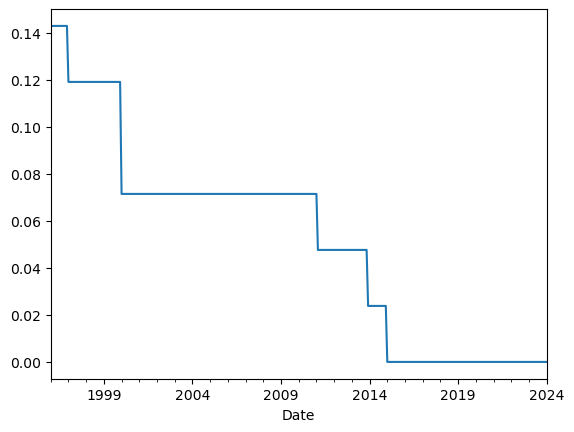

In [78]:
pd.isna(df).mean(axis=1).plot()

In [79]:
df = df.drop(columns = ['Spread Count','Lloyd_Diff'])
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 1996-01-31 to 2024-01-31
Freq: M
Data columns (total 40 columns):
 #   Column                                                                     Non-Null Count  Dtype  
---  ------                                                                     --------------  -----  
 0   Total DUC                                                                  122 non-null    float64
 1   Total US RigCount                                                          156 non-null    float64
 2   U.S. Product Supplied of Crude Oil (Thousand Barrels per Day)              337 non-null    float64
 3   U.S. Crude Oil Proved Reserves (Million Barrels)                           337 non-null    int64  
 4   U.S. Field Production of Crude Oil (Thousand Barrels)                      337 non-null    int64  
 5   Crude oil including lease condensate production                            337 non-null    float64
 6   Petroleum and other liquids pro

In [80]:
import copy
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from scipy.linalg import eig

import warnings

warnings.filterwarnings('ignore')

#import mlflow


class RecursivePCA: #(mlflow.pyfunc.PythonModel)

    def __init__(self, n_components="auto", pct_variance=0.85, prev_eigenvectors_=None, prev_columns_=None):
        '''
        Args:
            n_components: number of principal components, can also be "auto" to choose number based on pct of variance
            pct_variance: percentage of variante to determine the number of principal components
            prev_eigenvectors_: eigenvectors the yield the previous time the r2pca algorithm was fitted
            prev_columns_: name of the columns of the data of the previous time r2pca was fitted
        '''
        self.n_components_ = n_components
        self.pct_variance_ = pct_variance
        self.prev_eigenvectors_ = prev_eigenvectors_
        self.prev_columns_ = prev_columns_

    def autofit_n_components(self, data):  # autofit the number of principal components
        try:
            # calculate the eigenvalues of the covariance matrix
            variance = eig(data)[0]
            # sort them in descending order
            variance = np.sort(variance.real)[::-1]
            # calculate the cumulative sum of explained variance
            variance = np.cumsum(variance / np.sum(variance))
            # choose n_components to be number when the treshhold is met
            for i in range(len(variance)):
                if variance[i] >= self.pct_variance_:
                    self.n_components_ = int(i + 1)
                    break
                else:
                    self.n_components_ = 1
        except:
            # if it fails to assign a value, 1 will be the default
            self.n_components_ = 1

    def process_data_input(self, data):  # ensure data is a dataframe

        # the algorithm requires a 3d numpy array, if not provided, it will try to trasnform it into one

        if isinstance(data, dict):
            # method for a dictionaty of dataframes
            DATA = [data[i].values.reshape(1, data[i].shape[0], data[i].shape[1]) for i in data.keys()]
            DATA = np.vstack(DATA)
            return DATA
        elif isinstance(data, np.ndarray):
            # method for numpy array as input (3d or 2d)
            if len(data.shape) == 3:
                return data
            else:
                return data.reshape(1, data.shape[0], data.shape[1])
            return data
        elif isinstance(data, pd.DataFrame):
            # method for dataframe as input
            DATA = data.values
            DATA = DATA.reshape(1, DATA.shape[0], DATA.shape[1])
            return DATA
        else:
            raise TypeError(f'ERROR -> data is not a numpy array, instead is {type(data)}')

    def fit(self, data, curr_names=None):

        # make sure that the names of the current features is a list
        if curr_names is not None:
            if isinstance(curr_names, list) == False:
                curr_names = list(curr_names)

        # get a 3d numpy array as input
        DATA = self.process_data_input(data)

        # scale the input data
        scaled_data = self.scale(DATA)

        # if there is only 1 column then no reduction needs to be performed
        if DATA.shape[-1] == 1:
            self.n_components_ = 1
            self.current_variance = 1.0
            self.cosine_similarities = None
            self.prev_columns_ = curr_names
            self.prev_eigenvectors_ = np.array([[1.0]])
        # if there is more than 1 column, then perform reduction
        else:
            # calculate the average covariance
            COV = self.calc_cov(scaled_data)

            # if number of components is not a number, then estimate it based on the pct of variance
            if self.n_components_ == "auto" and self.prev_eigenvectors_ is None:
                self.autofit_n_components(COV)  # autofit the number of components
            elif self.n_components_ == "auto" and self.prev_eigenvectors_ is not None:
                raise ValueError("N components cannot be auto if you are passing a previous initialization")


            # get eigenvectors and eigenvalues
            val, cur_eigenvectors = eig(COV)
            cur_eigenvectors = cur_eigenvectors.T
            # sort the eigenvectors based on descending order of eigenvalues
            cur_eigenvectors = cur_eigenvectors[np.argsort(val.real)[::-1]]
            cur_eigenvectors = cur_eigenvectors[:(2 * self.n_components_)]
            cur_eigenvectors = cur_eigenvectors.real
            # get total variance just for backtesting purposes
            val = val[np.argsort(val.real)[::-1]]
            total_var = np.sum(val.real)
            current_var = 0

            # if we have previous eigenvectors we need to match the current ones to the previous ones recursively
            if self.prev_eigenvectors_ is not None:
                # check that we only compare the intersection of the columns of the current features and the previous ones
                prev_cols = [True] * self.prev_eigenvectors_.shape[1]
                curr_cols = [True] * cur_eigenvectors.shape[1]
                if self.prev_columns_ is not None and curr_names is not None:
                    k = 0
                    for col_i in self.prev_columns_:  # determine the ordering
                        if col_i not in curr_names:
                            prev_cols[k] = False
                        k += 1
                    k = 0
                    for col_i in curr_names:
                        if col_i not in self.prev_columns_:
                            curr_cols[k] = False
                        k += 1

                new_eigenvectors = np.zeros((self.n_components_, cur_eigenvectors.shape[1]))

                # for each eigenvector perform cosine similarity and re-order them
                for e_n in range(self.n_components_):
                    # calculate absolute value of cosine sim for each current eigenvector to all previous eigenvectors
                    cosine_sim = [np.abs(
                        self.prev_eigenvectors_[e_n][prev_cols] / np.linalg.norm(self.prev_eigenvectors_[e_n][prev_cols])
                        @ cur_eigenvectors[i][curr_cols] / np.linalg.norm(cur_eigenvectors[i][curr_cols]))
                                  for i in range(cur_eigenvectors.shape[0])]
                    try:
                        # find which one has the highest cosine similarity
                        pos = np.argmax(cosine_sim)
                        current_var += val[pos]
                        # delete from previous ones given that it cannot be matched again since its matched to current eigenvector
                        val = np.delete(val, pos, axis=0)
                        # if cosine sim if positive leave it as it is, if negative multiply by -1 to adjust the ordering
                        if (self.prev_eigenvectors_[e_n][prev_cols] / np.linalg.norm(
                                self.prev_eigenvectors_[e_n][prev_cols])
                            @ cur_eigenvectors[pos][curr_cols] / np.linalg.norm(cur_eigenvectors[pos][curr_cols])) < 0:

                            new_eigenvectors[e_n] = -cur_eigenvectors[pos]
                        else:
                            new_eigenvectors[e_n] = cur_eigenvectors[pos]
                        cur_eigenvectors = np.delete(cur_eigenvectors, pos, axis=0)
                    except:
                        cur_eigenvectors = None

                if cur_eigenvectors is None:
                    self.cosine_similarities = None
                    self.prev_eigenvectors_ = None
                else:
                    # calculate the cosine similarities of the final order for backtesting purposes
                    self.cosine_similarities = [self.prev_eigenvectors_[e_n][prev_cols] /
                                                np.linalg.norm(self.prev_eigenvectors_[e_n][prev_cols]) @
                                                new_eigenvectors[e_n][curr_cols] /
                                                np.linalg.norm(new_eigenvectors[e_n][curr_cols])
                                                for e_n in range(new_eigenvectors.shape[0])]
                    self.prev_eigenvectors_ = new_eigenvectors.copy()
            else:
                self.cosine_similarities = None
                self.prev_eigenvectors_ = cur_eigenvectors[:self.n_components_]
                # if the algorithm has not been fit before, make sure the first element of each eigevectors is positive
                # this is for consistency purposes so each time we fit the algorithm we get the same results for the same data
                for e_n in range(self.n_components_):
                    if self.prev_eigenvectors_[e_n][0] < 0:
                        self.prev_eigenvectors_[e_n] = -self.prev_eigenvectors_[e_n]

                current_var = np.sum(val[:self.n_components_].real)
            try:
                self.prev_columns_ = curr_names.copy()
            except:
                self.prev_columns_ = None

            # calculate explained variance for backtesting purposes
            self.current_variance = current_var.real / total_var

    def transform(self, data):

        DATA = copy.deepcopy(data)
        # get 3d numpy array
        DATA = self.process_data_input(DATA)

        if self.prev_eigenvectors_ is None:
            return None

        # if there is only 1 column no need to reduce
        if self.prev_eigenvectors_.shape[0] == 1 and self.prev_eigenvectors_.shape[1] == 1 and DATA.shape[-1] == 1:
            if DATA.shape[0] == 1:
                DATA[0] = self.scaler.transform(DATA[0])
            else:
                DATA = [self.scaler.transform(DATA[i]).reshape(1, DATA.shape[1], DATA.shape[2]) for i in range(DATA.shape[0])]
                DATA = np.vstack(DATA)
            return DATA
        # if there is more than 1 column
        else:
            # if there is only one asset/economy
            if DATA.shape[0] == 1:
                # scale data and multiply it by the eigenvectors
                DATA = self.scaler.transform(DATA[0])
                result = np.matmul(DATA, self.prev_eigenvectors_.T)#.reshape(1, DATA.shape[0], DATA.shape[1])
                result = result.reshape(1, result.shape[0], result.shape[1])
            # for multiple assets
            else:
                # scale data and multiply it by the eigenvectors
                DATA = [self.scaler.transform(DATA[i]) for i in range(DATA.shape[0])]
                result = np.vstack([np.matmul(DATA[i], self.prev_eigenvectors_.T).reshape(1, DATA[i].shape[0], -1) for i in range(len(DATA))])

        return result

    def fit_transform(self, data, curr_names=None):
        self.fit(data, curr_names)
        return self.transform(data)

    def scale(self, data):
        DATA = copy.deepcopy(data)
        self.scaler = StandardScaler()
        # since data is 3d and scaler needs to be 2d,
        # collapse the first 2 dimentions into 1 and fit the scaler
        # we would scale the data across all assets
        # then indidually transform each asset
        if DATA.shape[0] == 1:
            self.scaler.fit(DATA[0])
            DATA[0] = self.scaler.transform(DATA[0])
        else:
            self.scaler.fit(DATA.reshape(-1, DATA.shape[-1]))
            for i in range(DATA.shape[0]):
                DATA[i] = self.scaler.transform(DATA[i])

        return DATA

    def calc_cov(self, data):
        # the the covarinace of each asset individually
        # then take the average of them
        n = data.shape[0]
        if n == 1:
            temp_cov = np.cov(data[0].T)
        else:
            temp_cov = None
            for i in range(n):
                if temp_cov is None:
                    temp_cov = np.cov(data[i].T)
                else:
                    temp_cov += np.cov(data[i].T)
            temp_cov /= n

        return temp_cov

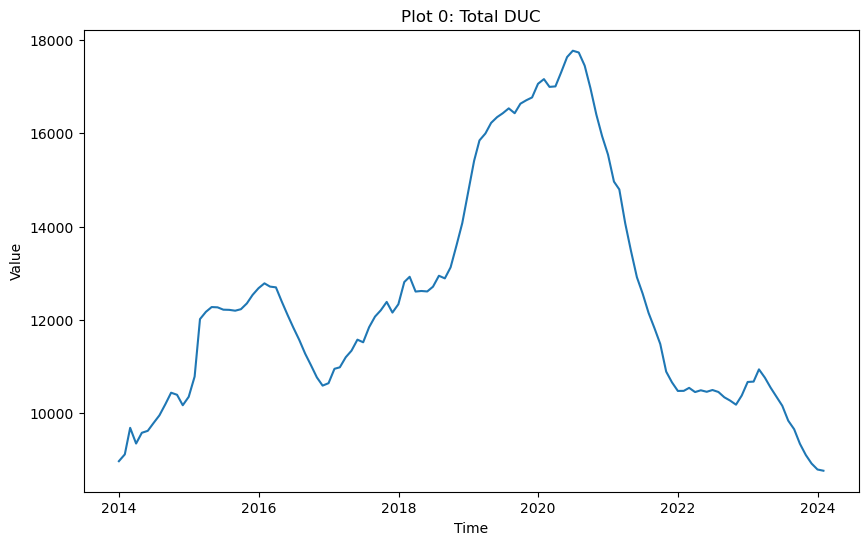

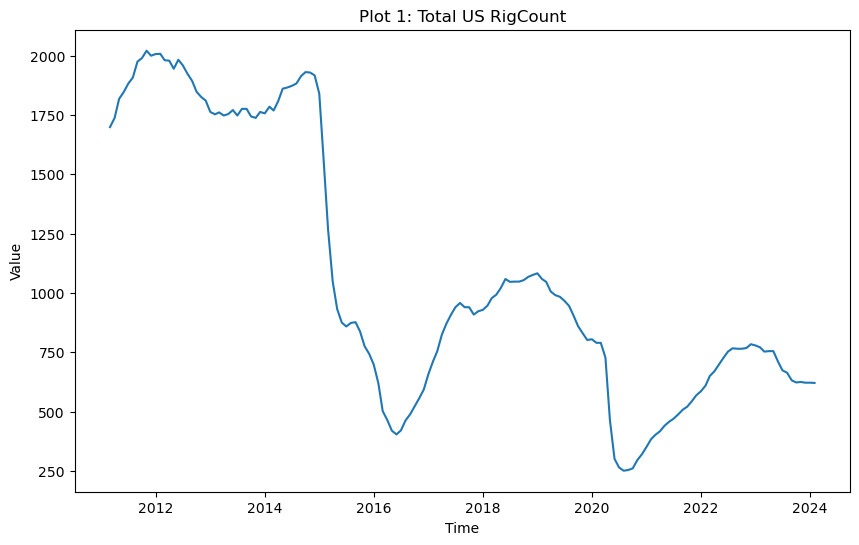

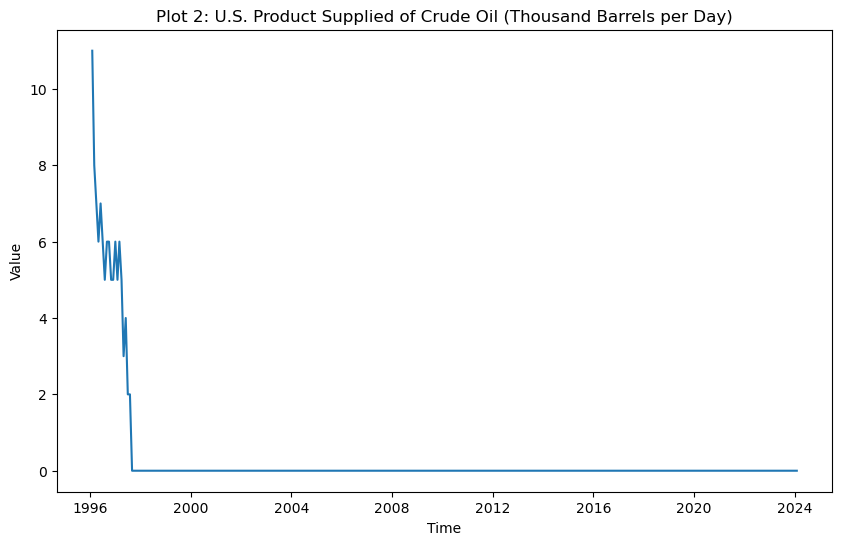

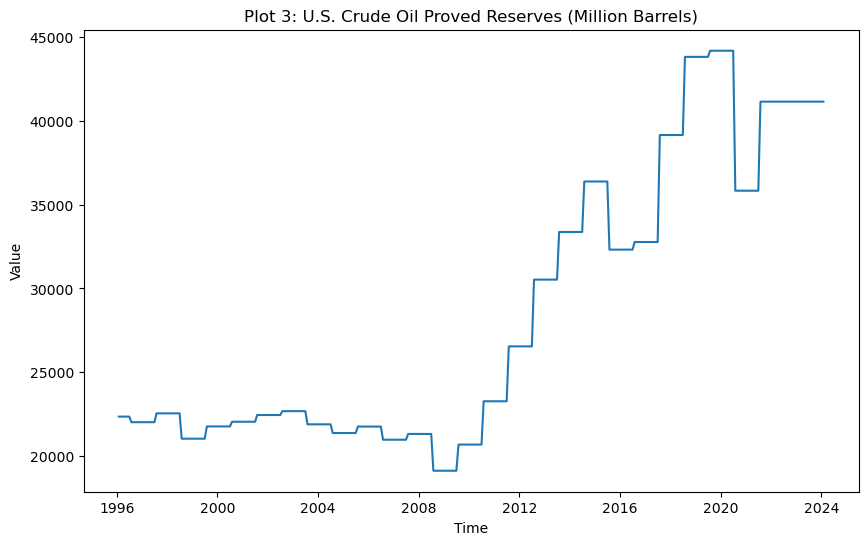

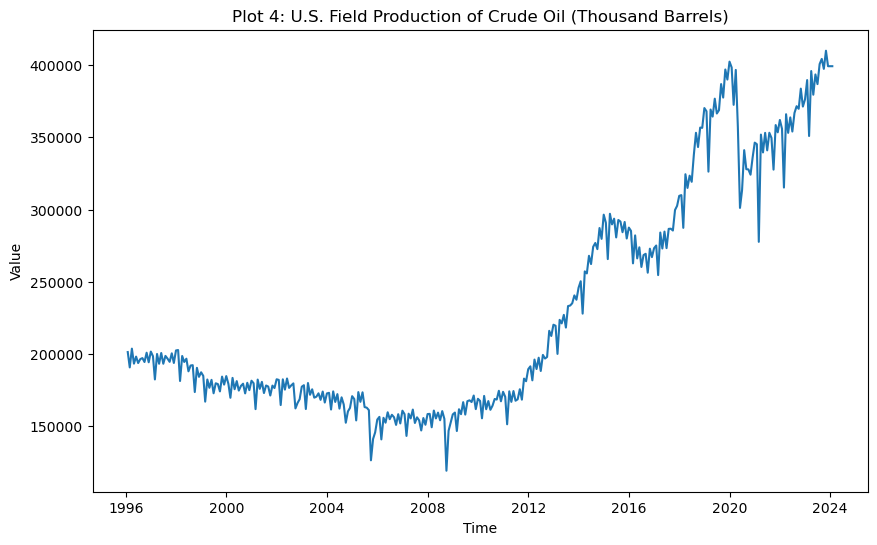

...

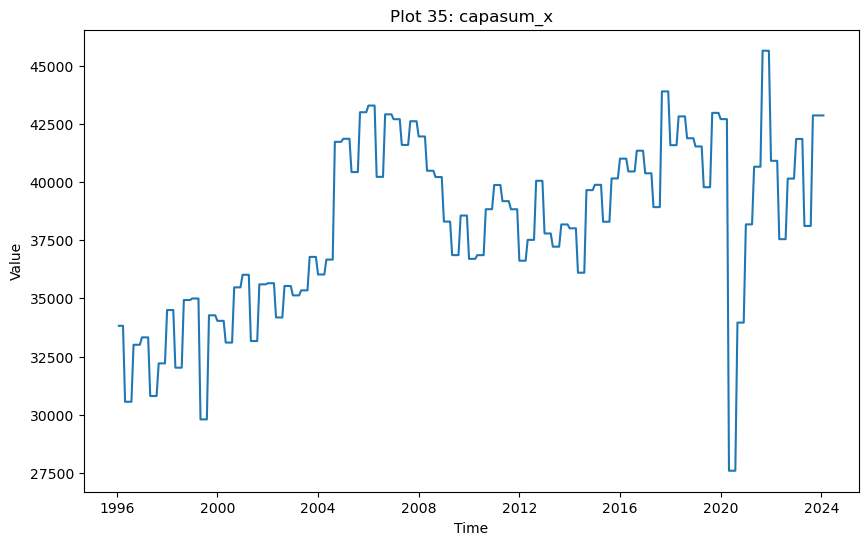

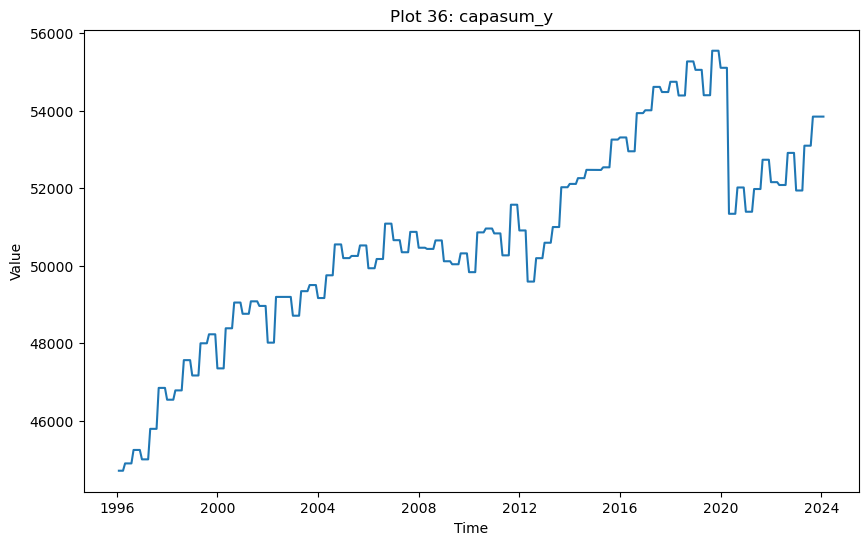

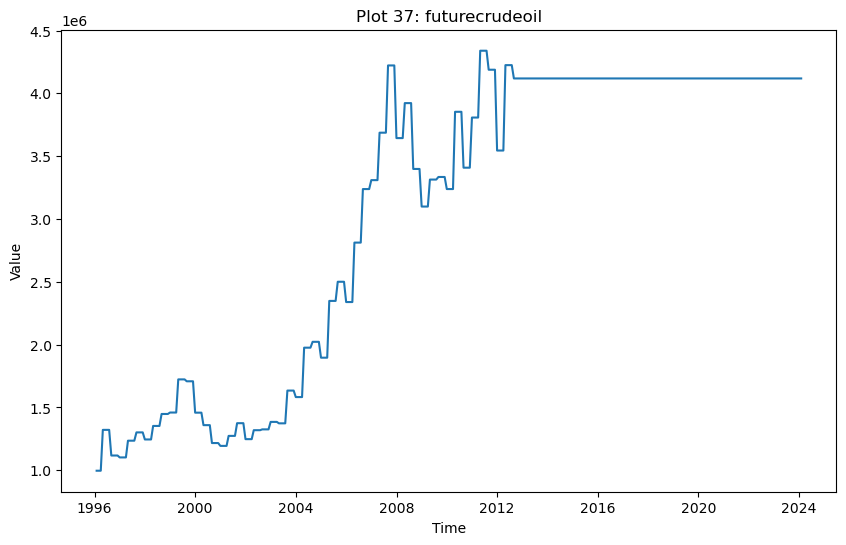

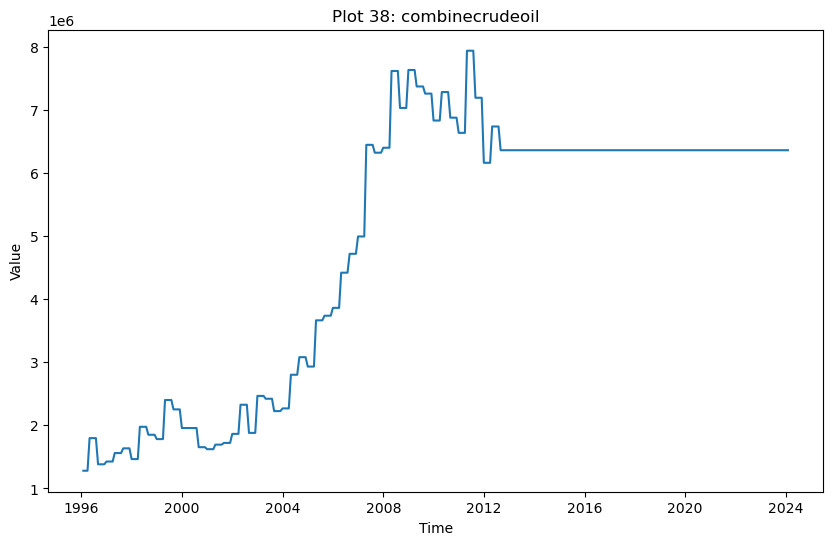

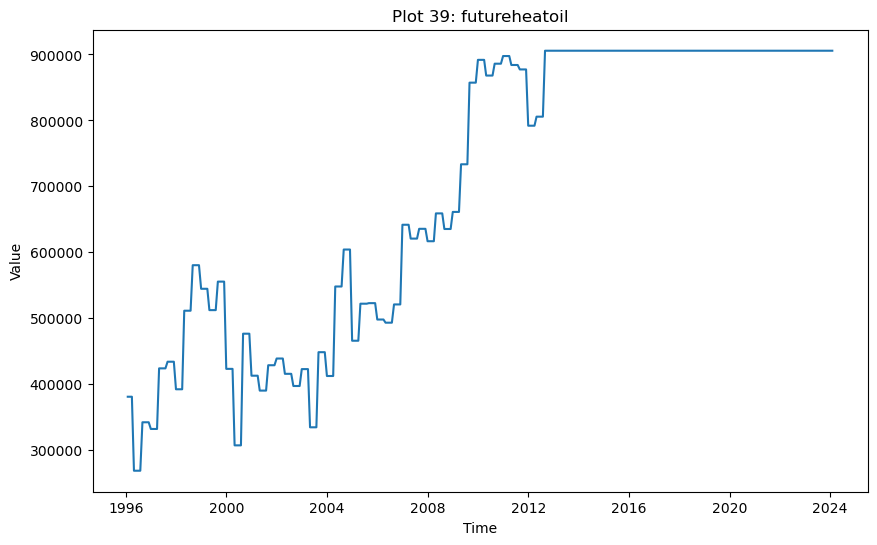

In [81]:
from matplotlib import pyplot as plt
for index, col_name in enumerate(df.columns):
    plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
    plt.plot(df[col_name])
    plt.title(f'Plot {index}: {col_name}')  # Adding a title with column index and name
    plt.xlabel('Time')  # Assuming the x-axis represents time
    plt.ylabel('Value')  # Assuming the y-axis represents some value
    plt.show()

## Exclude some features and detrend

In [82]:
# exclude features with high proportiono of nan values, or steady values over a long period of time that may have low contribution to predictive accuracy
features_to_exclude = ['Oceania_Imports','U.S. Product Supplied of Crude Oil (Thousand Barrels per Day)','futurecrudeoil', 'combinecrudeoil', 'futureheatoil']

# Get the remaining columns as a list
remaining_columns = [col for col in df.columns if col not in features_to_exclude]
df_selected_features = df[remaining_columns]
df_detrend = pd.DataFrame(index = df_selected_features.index)
for col in df_selected_features.columns:
  df_detrend[col] = df_selected_features[col].pct_change(6)

In [83]:
df_detrend.loc[['1996-06-30']].isna().any().sum()
df_detrend_notnan = df_detrend.loc['1996-07-31':].copy()

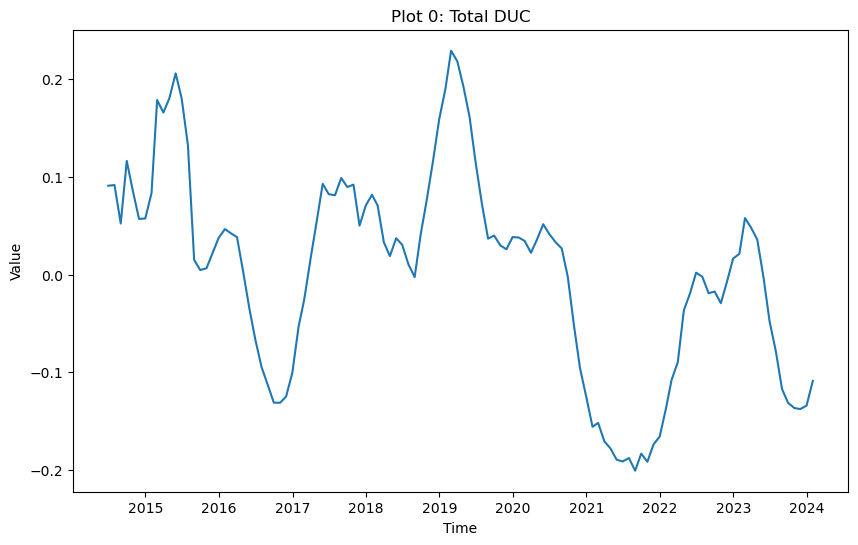

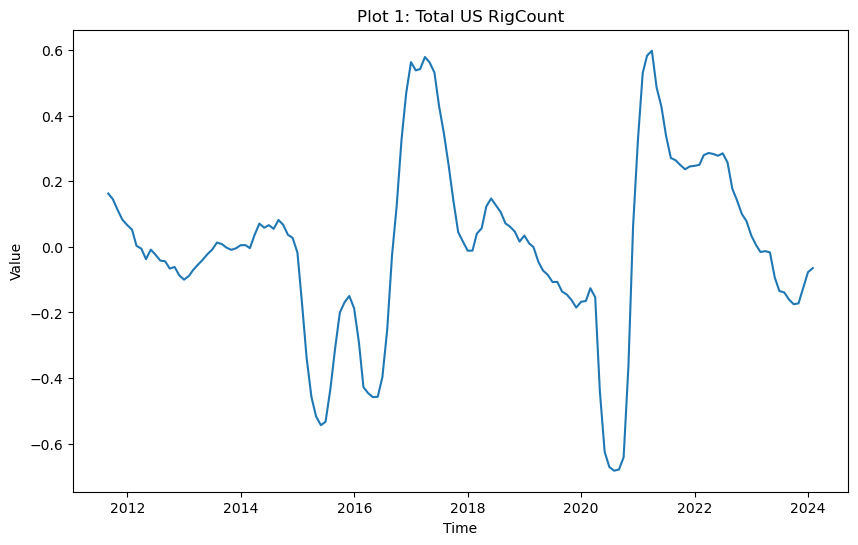

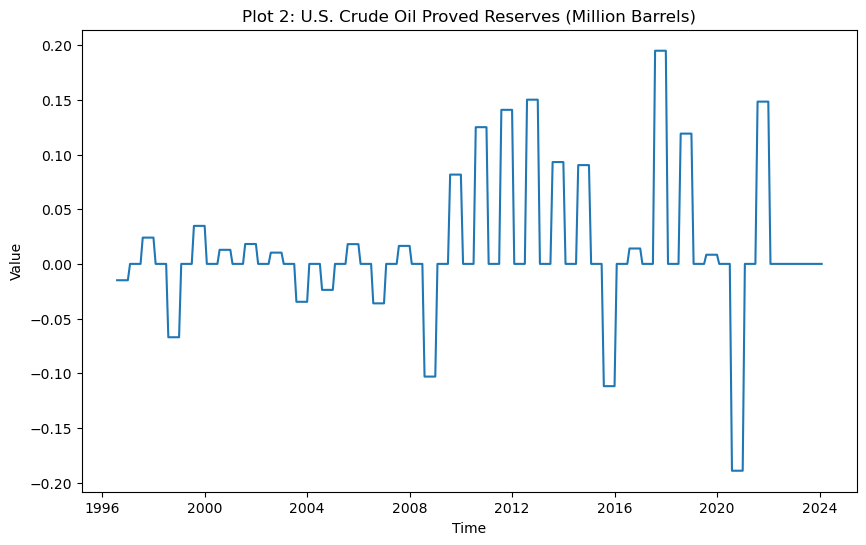

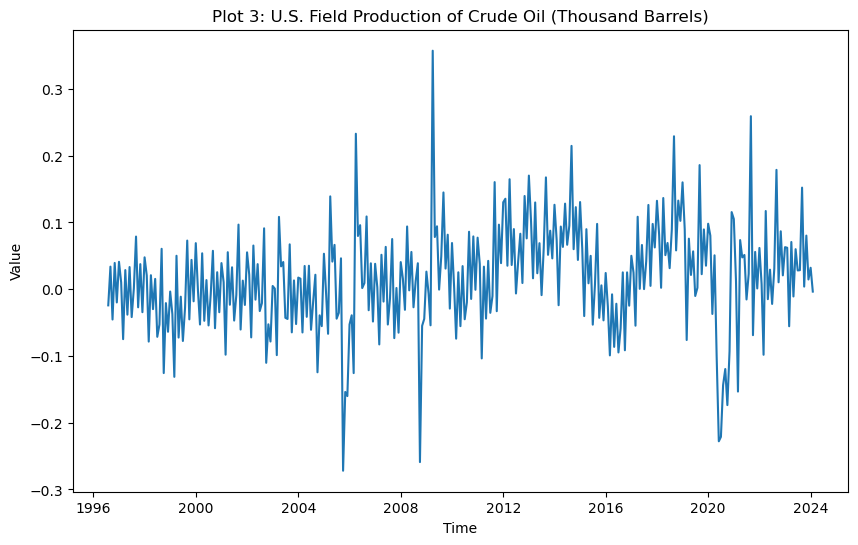

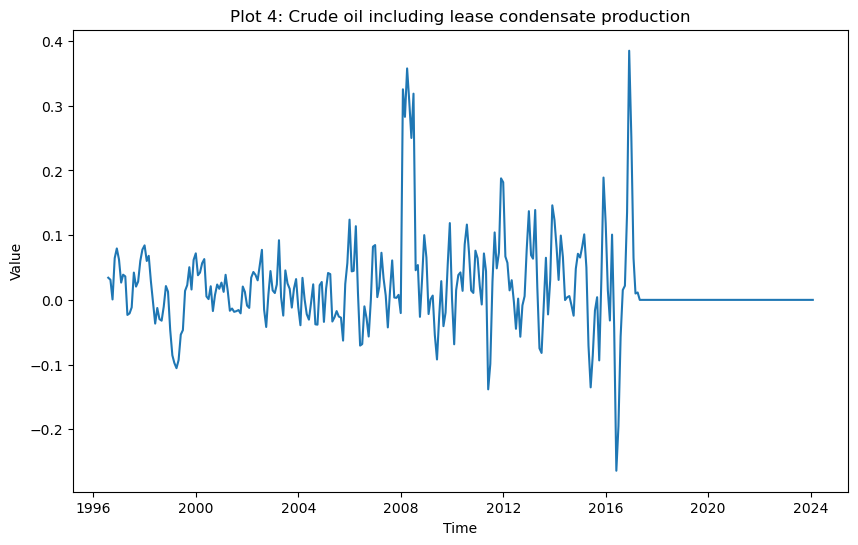

...

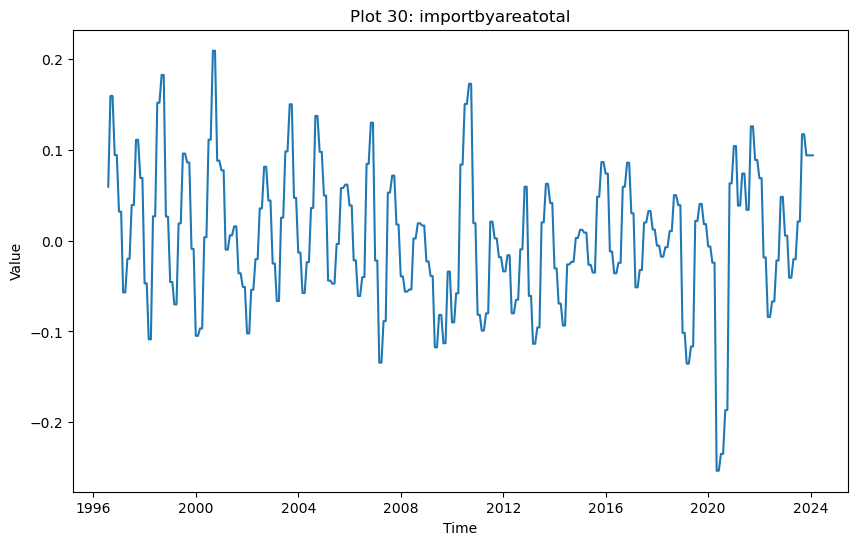

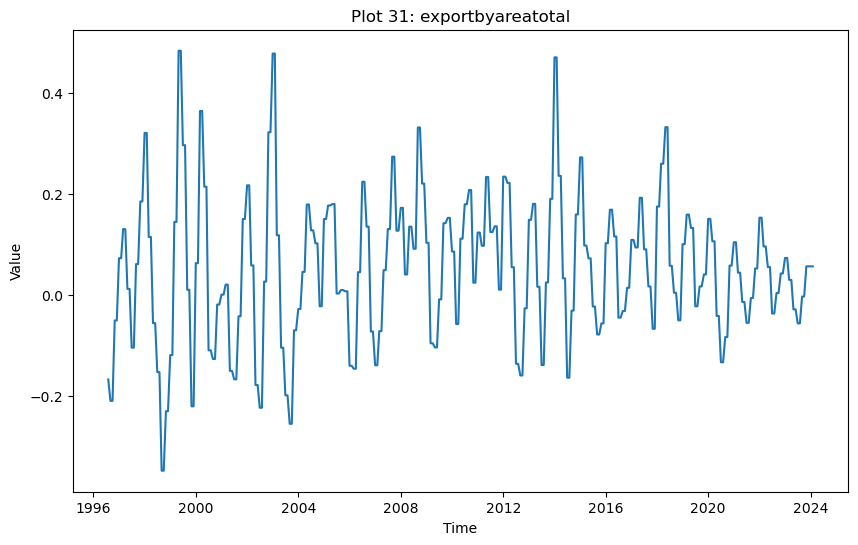

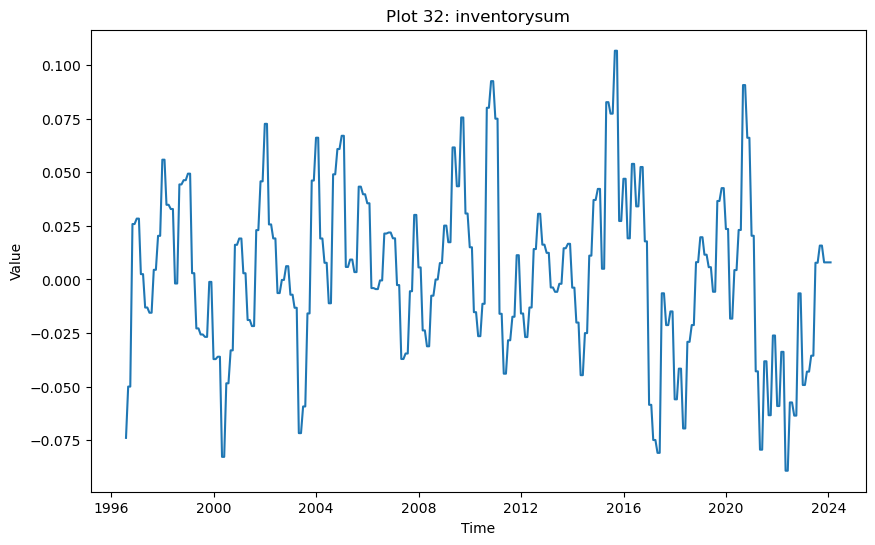

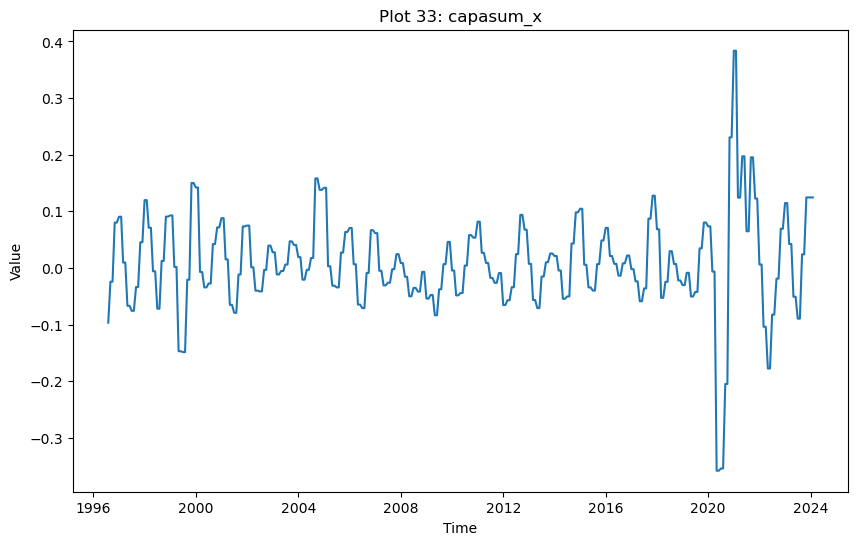

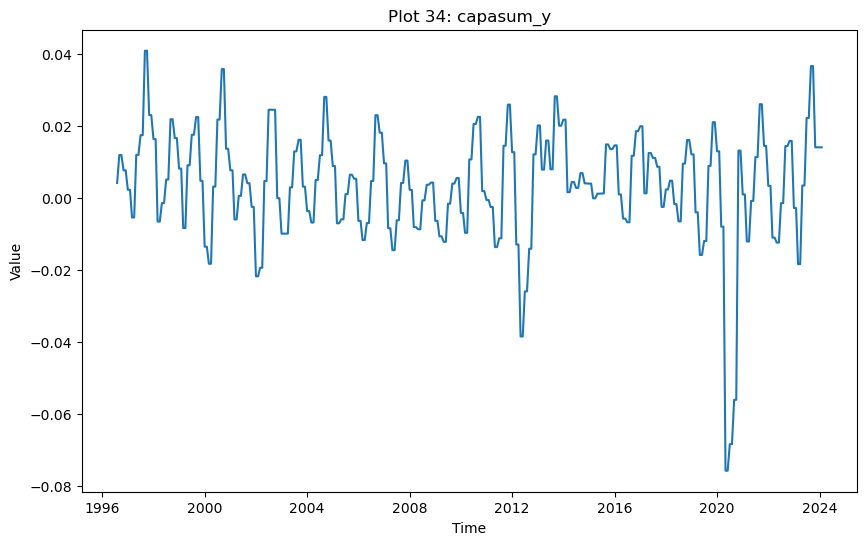

In [84]:
for index, col_name in enumerate(df_detrend_notnan.columns):
    plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
    plt.plot(df_detrend_notnan[col_name])
    plt.title(f'Plot {index}: {col_name}')  # Adding a title with column index and name
    plt.xlabel('Time')  # Assuming the x-axis represents time
    plt.ylabel('Value')  # Assuming the y-axis represents some value
    plt.show()

## Drop first half year nan values when taking pct_change(6), maybe any other methods?

In [85]:
df_detrend_notnan.columns

Index(['Total DUC', 'Total US RigCount',
       'U.S. Crude Oil Proved Reserves (Million Barrels)',
       'U.S. Field Production of Crude Oil (Thousand Barrels)',
       'Crude oil including lease condensate production',
       'Petroleum and other liquids production, Mexico (thousand barrels per day)',
       'Total Imports', 'Africa_Imports', 'Asia_Imports',
       'South America_Imports', 'Europe_Imports', 'North America_Imports',
       'Total Exports', 'Asia_Exports', 'Europe_Exports', 'Africa_Exports',
       'North America_Exports', 'South America_Exports', 'Oceania_Exports',
       'NYMEX - Light Sweet Crude $/bbl',
       'Federal Offshore--Gulf of Mexico Natural Gas Gross Withdrawals (MMcf)',
       'US Offshore', 'us_oil_gas_count', 'Canada Rig Count', 'OPEC-ORB',
       'NYMEX', 'Europe-Brent', 'Spot', 'USDiff_sum', 'WCS_Diff',
       'importbyareatotal', 'exportbyareatotal', 'inventorysum', 'capasum_x',
       'capasum_y'],
      dtype='object')

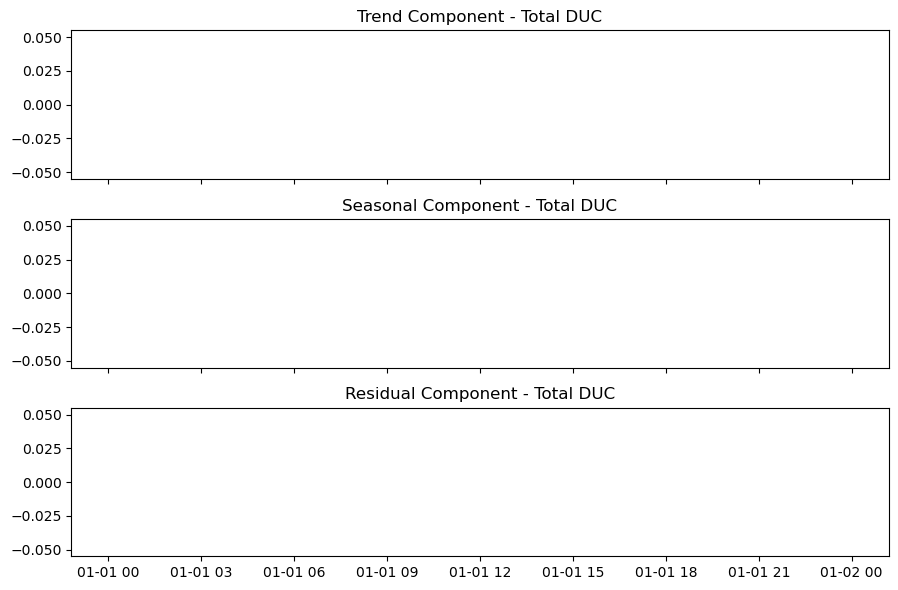

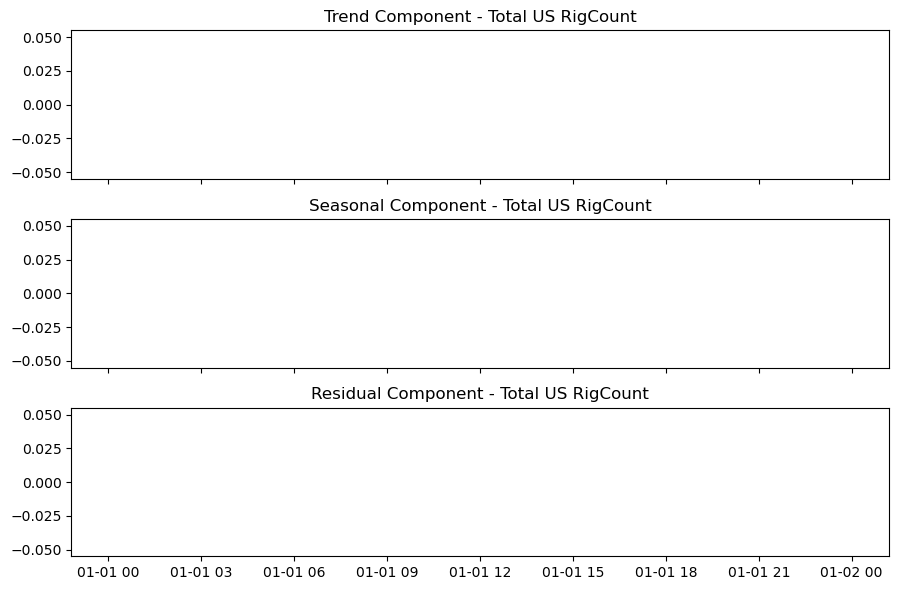

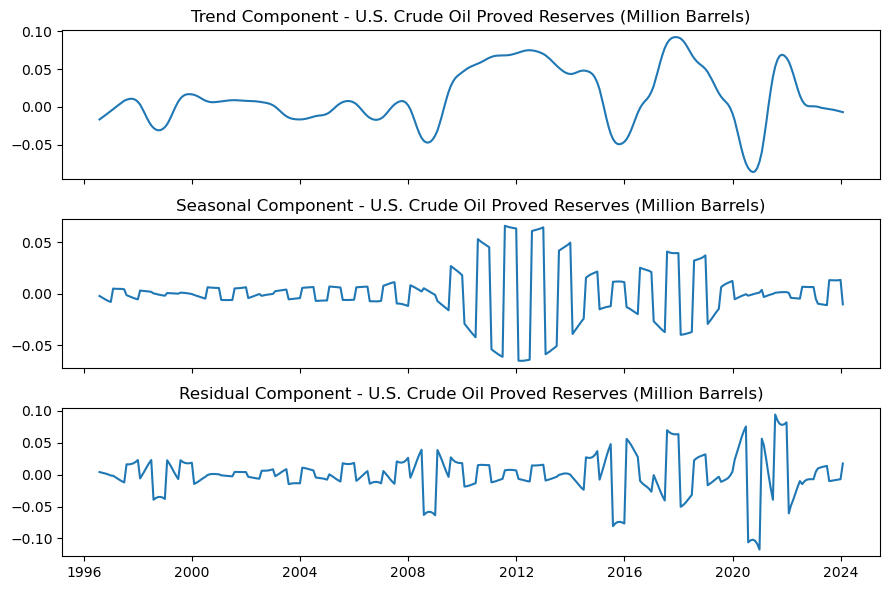

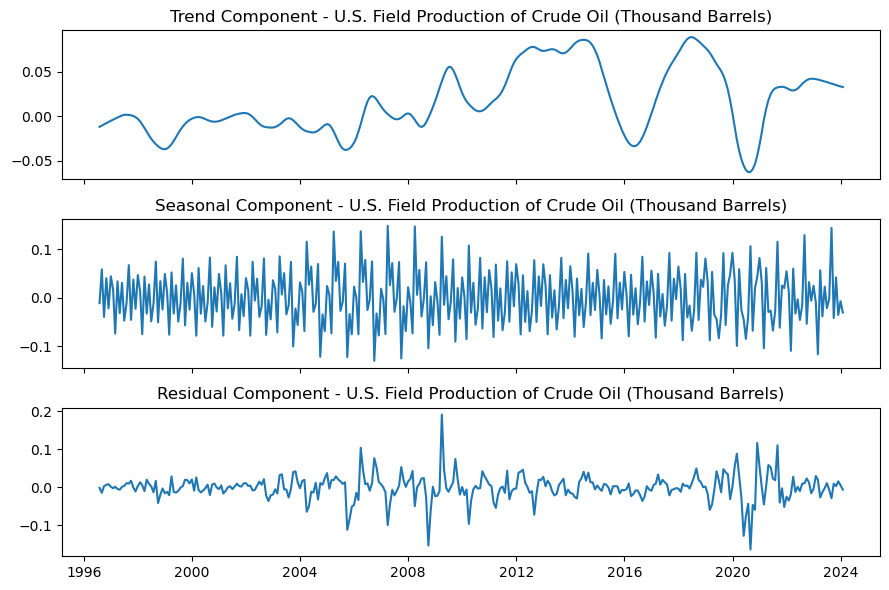

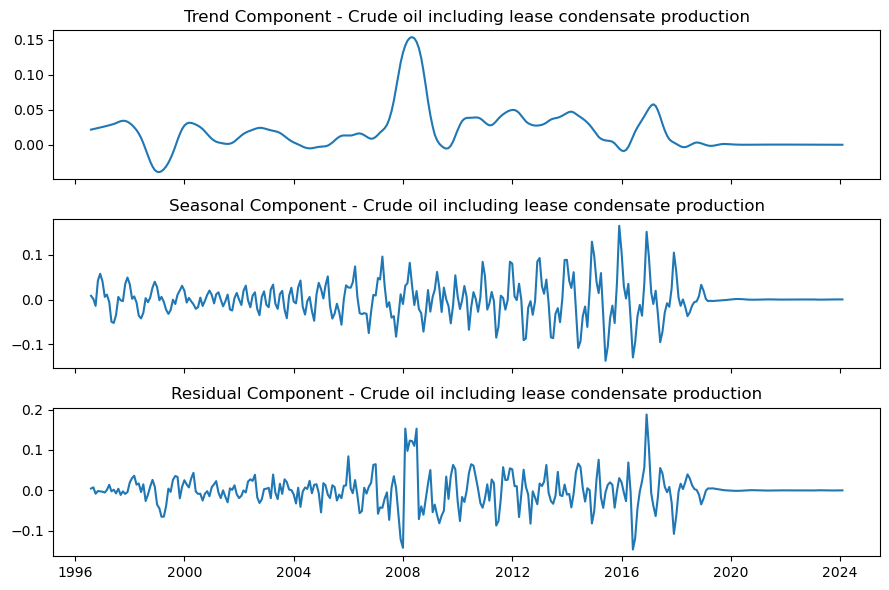

...

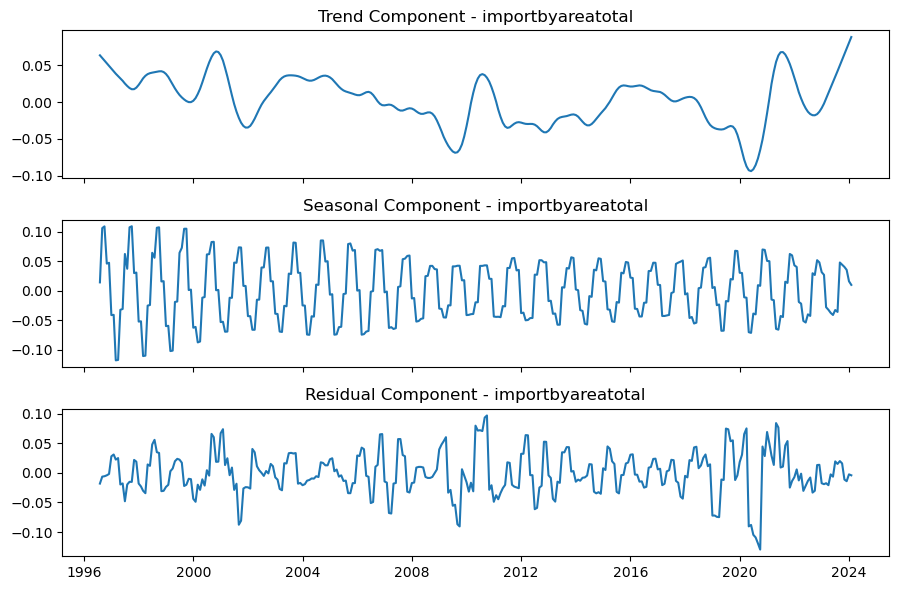

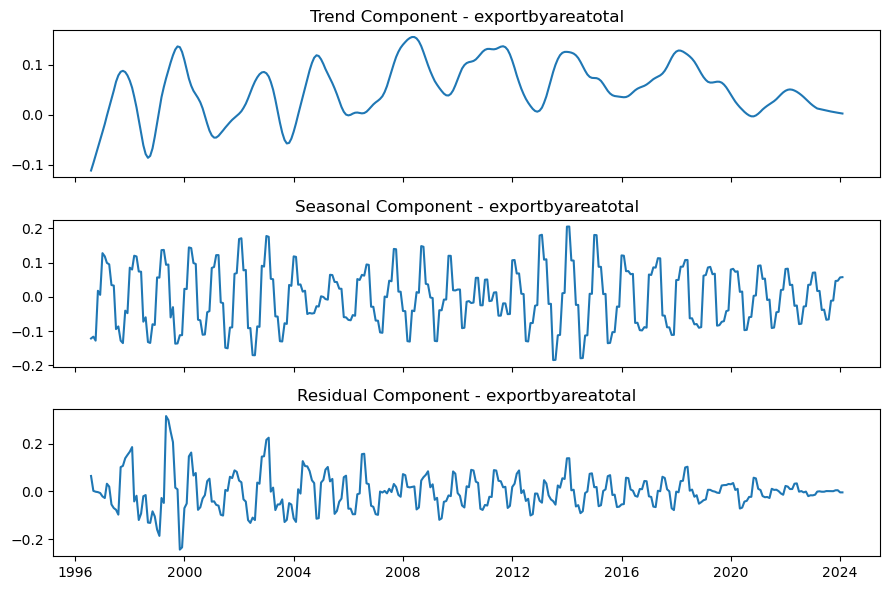

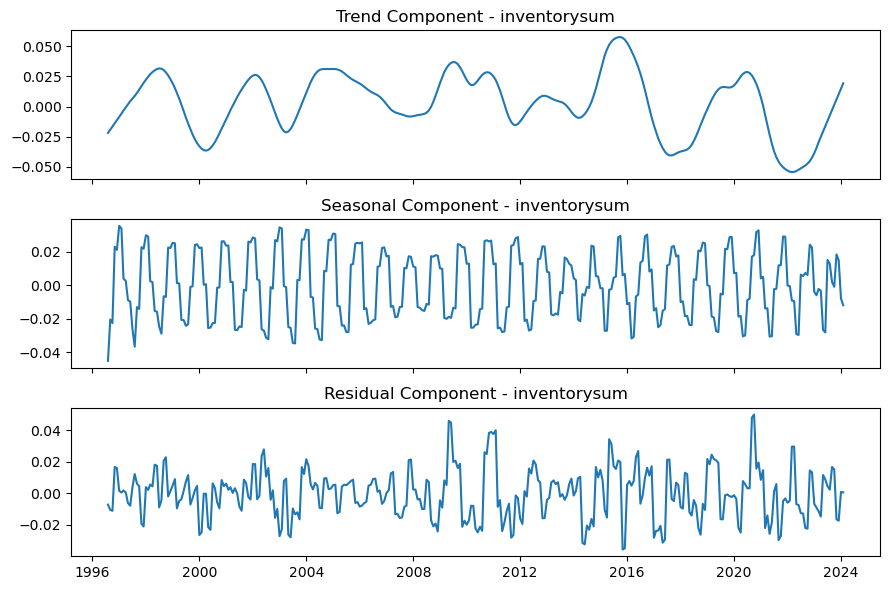

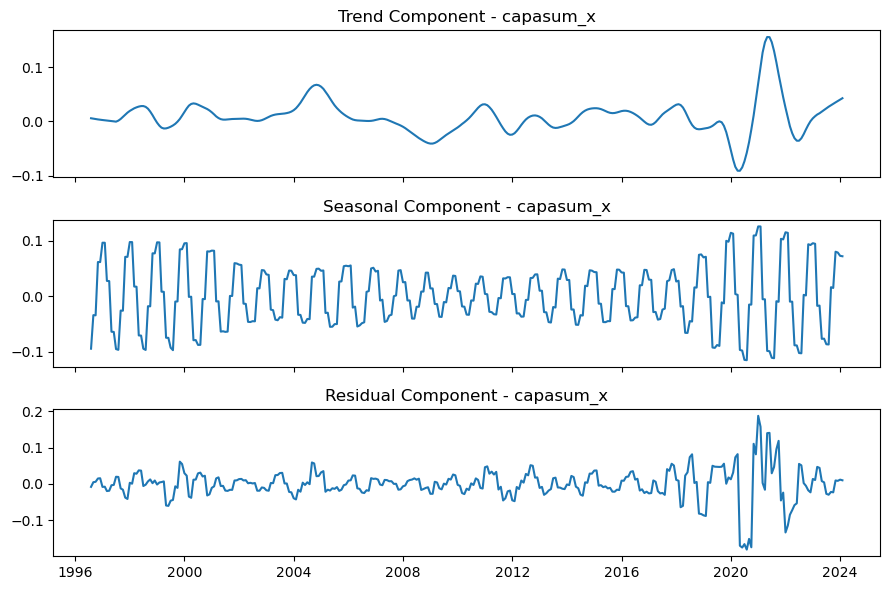

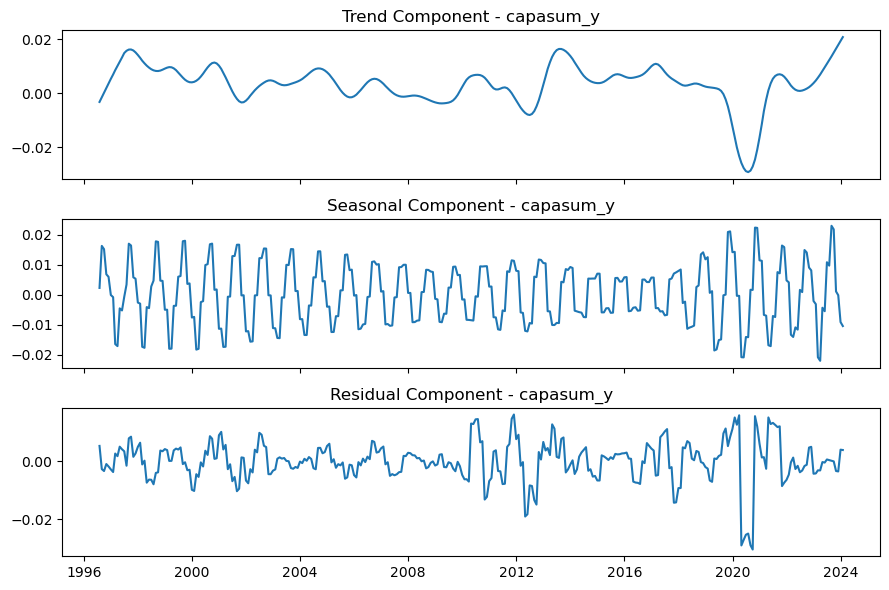

In [86]:
stl_results = {}
anomalies_dict = {}
from statsmodels.tsa.seasonal import STL
for col in df_detrend_notnan.columns:
    data_series = df_detrend_notnan[col]
    stl = STL(data_series)
    result = stl.fit()
    stl_results[col] = {
    'trend': result.trend,
    'seasonal': result.seasonal,
    'resid': result.resid
}
    fig, axes = plt.subplots(3, 1, figsize=(9, 6), sharex=True)
    axes[0].plot(result.trend)
    axes[0].set_title(f'Trend Component - {col}')
    axes[1].plot(result.seasonal)
    axes[1].set_title(f'Seasonal Component - {col}')
    axes[2].plot(result.resid)
    axes[2].set_title(f'Residual Component - {col}')
    plt.tight_layout()
    plt.show()
    resid_mu = result.resid.mean()
    resid_dev = result.resid.std()
    lower = resid_mu - 3*resid_dev
    upper = resid_mu + 3*resid_dev

    # Identify anomalies and store
    anomalies = result.resid[(result.resid < lower) | (result.resid > upper)]
    anomalies_dict[col] = anomalies

In [87]:
#1. make things stationary
#2. re run PCA and determine optimla # of components
#3. run classificaiton with the the new pcs
#4. run classification with new pcs and regimes
#5. run classification with new pcs and macro data

In [93]:
from sklearn.metrics.pairwise import cosine_similarity
n_steps = 5*12
n_components = 7 #as PC 7,8,9 has cosine similarity < 0.55

result = None
variances = []
cos_sims = []
optimalcom = []#number of optimal components
prev_eigenvectors_ = None
prev_columns_ = None
dates_for_plot = []

cos_sim_dict = {f"PC{i+1}": [] for i in range(9)}

cos_sim_df = None

for date_i in df_detrend_notnan.index:
    temp_data = df_detrend_notnan.loc[:date_i]
    temp_data = temp_data.iloc[-n_steps:]
    if len(temp_data.index) == n_steps:
        temp_data = temp_data.dropna(axis=1)
        pca = RecursivePCA(n_components=n_components,prev_eigenvectors_=prev_eigenvectors_,
                           prev_columns_=prev_columns_)
        pca.fit(temp_data, curr_names=list(temp_data.columns))
        td = pca.transform(temp_data)[0]
        td = pd.DataFrame(td, index=temp_data.index)

        td = td.loc[[date_i]]
        n_components = pca.n_components_
        optimalcom.append(n_components)
        #if prev_eigenvectors_ is not None:
            #prev_eigenvectors_ compute cosime sim wih pca.prev_eigenvectors_
            # and append it to cos_sim
        # pca.current_variance
        variances.append(pca.current_variance)

        dates_for_plot.append(date_i)

        prev_eigenvectors_ = pca.prev_eigenvectors_
        prev_columns_ = pca.prev_columns_

        temp = pd.DataFrame(pca.cosine_similarities, columns=[date_i]).T
        if cos_sim_df is None:
          cos_sim_df = copy.deepcopy(temp)
        else:
          cos_sim_df = pd.concat([cos_sim_df, temp])

        if result is None:
            result = copy.deepcopy(td)
        else:
            result = pd.concat([result, td])




In [94]:
result

,0,1,2,3,4,5,6
Date,,,,,,,
2001-06-30,-1.173701,1.064415,-1.415810,0.364910,1.017699,-0.446186,0.559062
2001-07-31,-1.562696,0.992755,-0.882796,0.227087,1.054693,-0.201552,1.386438
2001-08-31,-1.007643,-0.860594,3.481414,0.802421,-2.260093,-1.158832,-1.020071
2001-09-30,-1.256803,1.908491,-1.555031,0.528423,-0.303537,-0.473647,0.652891
2001-10-31,-1.843372,2.366488,0.722297,-0.731302,-1.006431,0.937695,1.856088
...,...,...,...,...,...,...,...
2023-09-30,0.030981,-2.954764,1.504102,0.113550,-0.016072,0.852964,0.440155
2023-10-31,0.527358,-1.188799,-1.154543,-1.106308,-0.028278,0.504312,-0.344383
2023-11-30,0.239994,-2.122928,-0.454642,-1.402888,-0.157025,-0.385997,-0.220108


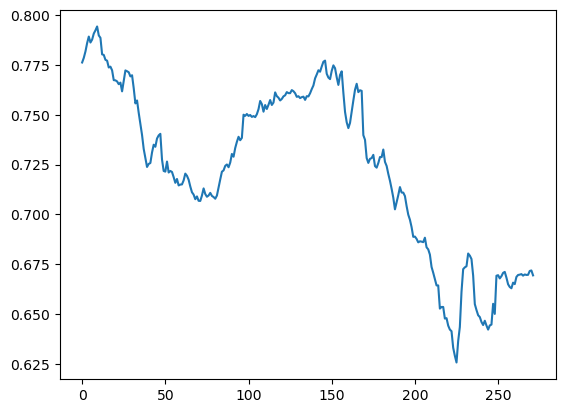

In [95]:
plt.plot(variances)

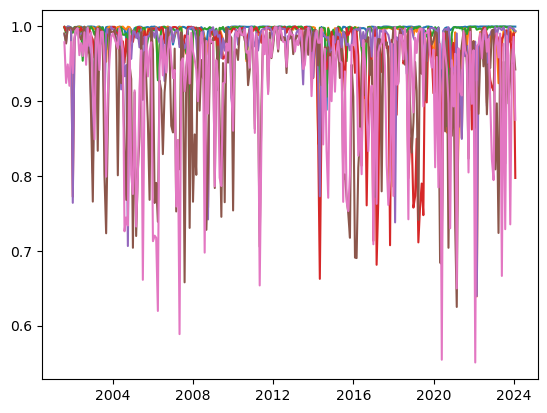

In [96]:
for col in cos_sim_df.columns:
  plt.plot(cos_sim_df[col])

In [97]:
columns_below_threshold = cos_sim_df.columns[(cos_sim_df < 0.55
                                              ).any()]

print(columns_below_threshold)

Index([], dtype='object')


In [98]:
GSPE = yf.download(['^GSPE'], start='2001-05-01', end='2024-01-31')
GSPC = yf.download(['^GSPC'], start='2001-05-01', end ='2024-01-31')
GSPE_monthly = GSPE['Adj Close'].resample('M').last()
GSPC_monthly = GSPC['Adj Close'].resample('M').last()
GSPE_monthly_returns = GSPE_monthly.pct_change().dropna()
GSPC_monthly_returns = GSPC_monthly.pct_change().dropna()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [99]:
combined_returns = pd.concat([GSPE_monthly_returns, GSPC_monthly_returns], axis=1).dropna()
combined_returns.columns = ['GSPE', 'GSPC']

In [100]:
combined_returns

,GSPE,GSPC
Date,,
2001-06-30,-0.067955,-0.025035
2001-07-31,-0.016568,-0.010740
2001-08-31,-0.039076,-0.064108
2001-09-30,-0.067790,-0.081723
2001-10-31,0.031559,0.018099
...,...,...
2023-09-30,0.024650,-0.048719
2023-10-31,-0.060761,-0.021980
2023-11-30,-0.016457,0.089179


In [101]:
X = sm.add_constant(combined_returns['GSPC'])
Y = combined_returns['GSPE']
model = sm.OLS(Y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                   GSPE   R-squared:                       0.395
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     176.3
Date:                Mon, 22 Apr 2024   Prob (F-statistic):           2.61e-31
Time:                        02:50:58   Log-Likelihood:                 400.34
No. Observations:                 272   AIC:                            -796.7
Df Residuals:                     270   BIC:                            -789.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.488e-05      0.003     -0.007      0.9

In [102]:
X = combined_returns['GSPC']
Y = combined_returns['GSPE']
model = sm.OLS(Y, X).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                   GSPE   R-squared (uncentered):                   0.399
Model:                            OLS   Adj. R-squared (uncentered):              0.397
Method:                 Least Squares   F-statistic:                              180.3
Date:                Mon, 22 Apr 2024   Prob (F-statistic):                    7.45e-32
Time:                        02:50:58   Log-Likelihood:                          400.34
No. Observations:                 272   AIC:                                     -798.7
Df Residuals:                     271   BIC:                                     -795.1
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [103]:
factor_energy = model.resid
binary_outcome = np.where(factor_energy > 0, 1, 0)
binary_outcome

array([0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0])

In [104]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

In [105]:
result

,0,1,2,3,4,5,6
Date,,,,,,,
2001-06-30,-1.173701,1.064415,-1.415810,0.364910,1.017699,-0.446186,0.559062
2001-07-31,-1.562696,0.992755,-0.882796,0.227087,1.054693,-0.201552,1.386438
2001-08-31,-1.007643,-0.860594,3.481414,0.802421,-2.260093,-1.158832,-1.020071
2001-09-30,-1.256803,1.908491,-1.555031,0.528423,-0.303537,-0.473647,0.652891
2001-10-31,-1.843372,2.366488,0.722297,-0.731302,-1.006431,0.937695,1.856088
...,...,...,...,...,...,...,...
2023-09-30,0.030981,-2.954764,1.504102,0.113550,-0.016072,0.852964,0.440155
2023-10-31,0.527358,-1.188799,-1.154543,-1.106308,-0.028278,0.504312,-0.344383
2023-11-30,0.239994,-2.122928,-0.454642,-1.402888,-0.157025,-0.385997,-0.220108


In [106]:
factor_energy

Date
2001-06-30   -0.042326
2001-07-31   -0.005574
2001-08-31    0.026552
2001-09-30    0.015870
2001-10-31    0.013031
                ...   
2023-09-30    0.074524
2023-10-31   -0.038261
2023-11-30   -0.107749
2023-12-31   -0.047195
2024-01-31   -0.019250
Freq: M, Length: 272, dtype: float64

In [107]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import numpy as np
N_MONTHS = 2
MIN_N_DATAPOINTS = 15

X = pd.DataFrame()  # Initialize X as an empty DataFrame
Y = np.array([])
Y_pred_LogReg = np.array([])
Y_pred_NB = np.array([])
ignore_first_date = True
Y_test = np.array([])
Y_pred_SVM = np.array([])
Y_pred_RF = np.array([])

for date_i in factor_energy.index:
    if len(factor_energy.loc[:date_i]) >= N_MONTHS:
        if ignore_first_date:
            ignore_first_date = False
            continue
        x_temp = result.index.get_loc(date_i) - N_MONTHS + 1
        temp_y = factor_energy.iloc[x_temp:x_temp + N_MONTHS]
        y_i = 0.0 if np.prod(temp_y + 1) < 1.0 else 1.0
        Y = np.append(Y, y_i)

        # Assuming that df_result already excludes non-numeric columns based on previous steps
        x_i = result.iloc[[x_temp]]
        if X is None:
            X = pd.DataFrame(x_i)
        else:
            X = pd.concat([X, x_i])

        # Ensure there are enough observations and features before fitting the model
        if X.shape[0] >= MIN_N_DATAPOINTS and X.dropna(axis=1).shape[1] > 0:
            common_non_nan_pcs = X.dropna(axis=1).columns
            X_train = X.iloc[:-1][common_non_nan_pcs]  # Use non-NaN PCs for training
            X_test = X.iloc[-1:][common_non_nan_pcs]   # Use the same non-NaN PCs for testing

            y_train = Y[:-1]
            y_test = Y[-1]

            logreg = LogisticRegression(penalty='l2')
            logreg.fit(X_train, y_train)
            y_pred_LogReg = logreg.predict(X_test)
            # Append predictions and actual values to respective arrays...
            Y_pred_LogReg = np.append(Y_pred_LogReg, y_pred_LogReg)
            Y_test = np.append(Y_test, y_test)

            #Naive Bayes
            naive_bayes = GaussianNB()
            naive_bayes.fit(X_train, y_train)
            y_pred_NB = naive_bayes.predict(X_test)
            Y_pred_NB = np.append(Y_pred_NB, y_pred_NB)

            #SVM
            svm = SVC(kernel='rbf', random_state=42, gamma='auto', C=1.5)
            svm.fit(X_train, y_train)
            #svm_params = {
            #'C': [0.5, 1, 1.5, 2],  # Regularization parameter
            #'gamma': ['scale', 'auto', 0.01, 0.001, 0.0001],  # Kernel coefficient
            #}
            #svm = SVC(kernel='rbf', random_state=42)
        #svm_grid = GridSearchCV(svm, svm_params, cv=5, scoring='accuracy', n_jobs=-1)
        #svm_grid.fit(X_train, y_train)
        #print("Best SVM Parameters:", svm_grid.best_params_)
        #print("Best SVM Accuracy:", svm_grid.best_score_)
            y_pred_SVM = svm.predict(X_test)
            Y_pred_SVM = np.append(Y_pred_SVM, y_pred_SVM)



            #Random Forest
            #random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
            #random_forest.fit(X_train, y_train)
            #y_pred_RF = random_forest.predict(X_test)
            #Y_pred_RF = np.append(Y_pred_RF, y_pred_RF)





In [108]:
from sklearn.metrics import accuracy_score
accuracy_score(Y_test, Y_pred_SVM)

0.6328125

In [109]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import numpy as np
N_MONTHS = 2
MIN_N_DATAPOINTS = 15

X = pd.DataFrame()  # Initialize X as an empty DataFrame
Y = np.array([])

ignore_first_date = True
Y_test = np.array([])
Y_pred_SVM = np.array([])

for date_i in factor_energy.index:
    if len(factor_energy.loc[:date_i]) >= N_MONTHS:
        if ignore_first_date:
            ignore_first_date = False
            continue
        x_temp = result.index.get_loc(date_i) - N_MONTHS + 1
        temp_y = factor_energy.iloc[x_temp:x_temp + N_MONTHS]
        y_i = 0.0 if np.prod(temp_y + 1) < 1.0 else 1.0
        Y = np.append(Y, y_i)

        # Assuming that df_result already excludes non-numeric columns based on previous steps
        x_i = result.iloc[[x_temp]]
        if X is None:
            X = pd.DataFrame(x_i)
        else:
            X = pd.concat([X, x_i])

        # Ensure there are enough observations and features before fitting the model
        if X.shape[0] >= MIN_N_DATAPOINTS and X.dropna(axis=1).shape[1] > 0:
            common_non_nan_pcs = X.dropna(axis=1).columns
            X_train = X.iloc[:-1][common_non_nan_pcs]  # Use non-NaN PCs for training
            X_test = X.iloc[-1:][common_non_nan_pcs]   # Use the same non-NaN PCs for testing

            y_train = Y[:-1]
            y_test = Y[-1]


            svm_params = {
                'C': np.logspace(-5, 5, num=11),  # Regularization parameter
                'gamma': np.logspace(-5, 5, num=11) ,  # Kernel coefficient
            }
            svm = SVC(kernel='rbf', random_state=42)
            svm_grid = GridSearchCV(svm, svm_params, cv=5, scoring='accuracy', n_jobs=-1)
            svm_grid.fit(X_train, y_train)

            print("Best SVM Parameters:", svm_grid.best_params_)
            print("Best SVM Accuracy:", svm_grid.best_score_)

            y_pred_SVM = svm_grid.predict(X_test)
            Y_pred_SVM = np.append(Y_pred_SVM, y_pred_SVM)
            Y_test = np.append(Y_test, y_test)



Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.8666666666666666
Best SVM Parameters: {'C': 10.0, 'gamma': 0.01}
Best SVM Accuracy: 0.9333333333333332
Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.9333333333333332
Best SVM Parameters: {'C': 100.0, 'gamma': 0.001}
Best SVM Accuracy: 0.8833333333333334
Best SVM Parameters: {'C': 100.0, 'gamma': 0.001}
Best SVM Accuracy: 0.7166666666666667
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.7333333333333333
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.75
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.72
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.6900000000000001
Best SVM Parameters: {'C': 1000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.77
Best SVM Parameters: {'C': 1000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.75
Best SVM Parameters: {'C': 1000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.76
Best SVM Parame

Best SVM Parameters: {'C': 10000.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6403162055335968
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6347826086956522
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.6553359683794466
Best SVM Parameters: {'C': 1.0, 'gamma': 0.1}
Best SVM Accuracy: 0.658102766798419
Best SVM Parameters: {'C': 1.0, 'gamma': 0.1}
Best SVM Accuracy: 0.6782608695652175
Best SVM Parameters: {'C': 1.0, 'gamma': 0.1}
Best SVM Accuracy: 0.6554347826086956
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.6413043478260869
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.6358695652173914
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.6304347826086957
Best SVM Parameters: {'C': 10.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6666666666666666
Best SVM Parameters: {'C': 1e-05, 'gamma': 1e-05}
Best SVM Accuracy: 0.628
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.001}
Best

Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6305458768873404
Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6371660859465738
Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6241579558652729
Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6313588850174215
Best SVM Parameters: {'C': 100.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6285714285714286
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.01}
Best SVM Accuracy: 0.6018826135105204
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.5700996677740864
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.5674418604651164
Best SVM Parameters: {'C': 100000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.5509413067552603
Best SVM Parameters: {'C': 1000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.5627906976744186
Best SVM Parameters: {'C': 10000.0, 'gamma': 0.001}
Best SVM Accuracy: 0.5643763213530655
Best SVM Parameters: {'C':

In [110]:
accuracy_score(Y_test, Y_pred_SVM)

0.60546875

In [111]:
accuracy_score(Y_test, Y_pred_LogReg), accuracy_score(Y_test, Y_pred_NB), accuracy_score(Y_test, Y_pred_SVM)

(0.57421875, 0.56640625, 0.60546875)

# Grid Search and Weights

In [113]:
regime_data['regime_2'][0]

array([1.86979454e-11, 6.06225599e-03, 9.93937744e-01])

In [114]:
regime_data.index.name='Date'

In [115]:
result = result.loc[:'2022-12-31']
result

,0,1,2,3,4,5,6
Date,,,,,,,
2001-06-30,-1.173701,1.064415,-1.415810,0.364910,1.017699,-0.446186,0.559062
2001-07-31,-1.562696,0.992755,-0.882796,0.227087,1.054693,-0.201552,1.386438
2001-08-31,-1.007643,-0.860594,3.481414,0.802421,-2.260093,-1.158832,-1.020071
2001-09-30,-1.256803,1.908491,-1.555031,0.528423,-0.303537,-0.473647,0.652891
2001-10-31,-1.843372,2.366488,0.722297,-0.731302,-1.006431,0.937695,1.856088
...,...,...,...,...,...,...,...
2022-08-31,2.420502,-1.299182,-3.089348,-1.440617,-1.313890,-1.523308,-0.783644
2022-09-30,-1.340568,-0.755896,-1.268434,-0.478949,0.271833,-0.137542,-0.212923
2022-10-31,-0.666142,-1.750807,-1.259699,0.608158,0.610624,0.277363,1.118472


In [116]:
regime_data =  regime_data.loc["2001-06-30":]

In [117]:
regime_data

,regime,regime_1,regime_2,regime_3
Date,,,,
2001-06-30,"[4.786882551552154e-52, 1.212095468711317e-14,...","[4.786882551552095e-52, 1.2120954687113021e-14...","[2.0870397471294985e-16, 0.005156986660118466,...","[0.0001183937119687892, 0.010081198703820229, ..."
2001-07-31,"[0.9999743523882312, 2.5647611804563615e-05, 3...","[0.9999743523881954, 2.5647611804562697e-05, 3...","[0.9844687376621776, 0.015530951358457832, 3.1...","[0.9695345639758018, 0.03021414903692005, 0.00..."
2001-08-31,"[0.9999985027495608, 1.497250305365559e-06, 1....","[0.9999985027496946, 1.4972503053657593e-06, 1...","[0.9854735627709936, 0.014526419477184678, 1.7...","[0.9714597831402771, 0.028310566272829792, 0.0..."
2001-09-30,"[0.9999999594465415, 4.055342518294255e-08, 7....","[0.9999999594465748, 4.05534251829439e-08, 7.7...","[0.9855978480781294, 0.014402151441470324, 4.8...","[0.9716999842635059, 0.02807253617965825, 0.00..."
2001-10-31,"[0.9999999975111677, 2.4887396770122415e-09, 1...","[0.9999999975112603, 2.488739677012472e-09, 1....","[0.9857231650199856, 0.014276834950553801, 2.9...","[0.9719435903631881, 0.027831071786944668, 0.0..."
...,...,...,...,...
2022-08-31,"[8.161702802713057e-05, 1.9513685749301315e-19...","[8.161702802715658e-05, 1.9513685749307533e-19...","[0.007060000554331456, 0.004641555144907588, 0...","[0.013844463017390084, 0.009198205681476068, 0..."
2022-09-30,"[6.787915938506803e-05, 3.9246879798170866e-19...","[6.787915938505652e-05, 3.9246879798164216e-19...","[0.007026513042049591, 0.004627421652966065, 0...","[0.013792127875820615, 0.00917044375218406, 0...."
2022-10-31,"[9.628488077974587e-06, 4.020237991791545e-20,...","[9.628488077978383e-06, 4.0202379917931297e-20...","[0.006952651686227849, 0.004615504963453315, 0...","[0.01370347554147466, 0.009146989379940329, 0...."


In [120]:
Y_pred_SVM = np.array([])
Y_test = np.array([])
import random
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
import numpy as np
import pandas as pd

np.random.seed(42)
random.seed(42)
ignore_first_date = True
def perform_grid_search_svm(X_train, y_train, sample_weights):
    param_grid = {
        'C': [0.1, 1, 10, 100],  # Example C values, adjust based on your problem
        'gamma': ['scale', 'auto', 0.01, 0.001, 0.0001],  # Example gamma values
    }
    svm_rbf = SVC(kernel='rbf', probability=True, random_state=42)  # Enable probability estimation
    grid_search = GridSearchCV(estimator=svm_rbf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='accuracy')

    # Ensure X_train is C-contiguous
    X_train_contiguous = np.ascontiguousarray(X_train)
    sample_weights_contiguous = np.ascontiguousarray(sample_weights)

    grid_search.fit(X_train_contiguous, y_train, sample_weight=sample_weights_contiguous)
    return grid_search.best_estimator_

# Function to train logistic regression models for each regime and predict
def train_and_predict_with_regimes(X, y, x_test, P, probability_of_regime_i):

    # check that x_test has shape (1, -1)
    models = {}
    y_pred = 0.0

    for i, P_i in enumerate(P.T):  # P.T assumes that regimes are in columns
        #print(X.shape)
        #print(y.shape)
        #print(P_i.shape)
        models[i] = perform_grid_search_svm(X, y, P_i)

    for i, model in models.items():
        probabilities = float(model.predict_proba(x_test)[:, 1])  # Probability for the positive class
        y_pred += probabilities * probability_of_regime_i[i]

    y_pred_final = (y_pred > 0.5).astype(float)
    return y_pred_final

total_iterations = len([date for date in factor_energy.index if len(factor_energy.loc[:date].index) >= N_MONTHS])


X = None
Y = np.array([])


resultY = []  # Initialize an empty list to store predictions
Y_test = np.array([])
Y_pred_SVM = np.array([])


P = None
i = 0
# Main loop to iterate over dates
for date_i in tqdm(factor_energy.index, total=total_iterations, desc='Processing'):
    if len(factor_energy.loc[:date_i].index) >= N_MONTHS:
        temp_y = factor_energy.loc[:date_i]

        if ignore_first_date:
            ignore_first_date = False
        else:
            x_temp = temp_y.index[-(N_MONTHS+1)]
            temp_y = temp_y.iloc[-N_MONTHS:]
            y_i = 0.0 if np.prod(temp_y+1) < 1.0 else 1.0
            Y = np.append(Y, y_i)
            x_i = result.loc[[x_temp]]
            current_regime_weights = (regime_data.loc[date_i, 'regime']).reshape(1, -1)
            #print(date)
            if X is None:
                X = x_i
                P = current_regime_weights
            else:
                X = pd.concat([X, x_i])
                P = np.concatenate((P, current_regime_weights), axis=0)



            if X.shape[0] >= MIN_N_DATAPOINTS:
                # Assume X now contains the features and y contains the target
                X_train = np.ascontiguousarray((X.iloc[:-1, :]).values)
                X_test = np.ascontiguousarray(((X.iloc[-1]).values).reshape(1, -1))
                y_train = Y[:-1]



                y_test = Y[-1]
                Y_test = np.append(Y_test, y_test)

                P_train = P[:-1]

                # Get the regime weights and probabilities for the current date

                current_regime_probabilities = regime_data.loc[date_i, f'regime_{N_MONTHS}']


                # Additionally, use regime-based models to predict
                y_pred_final_svm = train_and_predict_with_regimes(X_train, y_train, X_test, P_train, current_regime_probabilities)
                # Now you have two sets of predictions: y_pred_RF from the best RF model, and y_pred_final from regime-based models
                # You can compare, combine or analyze them as needed for your application
                Y_pred_SVM = np.append(Y_pred_SVM, y_pred_final_svm)


Processing: 259it [00:17, 14.46it/s]                                            


# Grid Search + Regime + Random Forest


In [122]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from tqdm import tqdm
import numpy as np
import pandas as pd
import random

np.random.seed(42)
random.seed(42)


N_MONTHS = 2
MIN_N_DATAPOINTS = 15
ignore_first_date = True
# Function to perform grid search with sample weights
def perform_grid_search(X_train, y_train, sample_weights):
    param_grid = {
        'n_estimators': [10, 50, 100],
        'max_depth': [None, 10, 20],
        'bootstrap': [True, False]
    }
    rf = RandomForestClassifier(random_state=42)
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, scoring='accuracy')
    grid_search.fit(X_train, y_train, sample_weight=sample_weights)
    return grid_search.best_estimator_

# Function to train logistic regression models for each regime and predict
def train_and_predict_with_regimes(X, y, x_test, P, probability_of_regime_i):

    # check that x_test has shape (1, -1)
    models = {}
    y_pred = 0.0

    for i, P_i in enumerate(P.T):  # P.T assumes that regimes are in columns
        #print(X.shape)
        #print(y.shape)
        #print(P_i.shape)
        models[i] = perform_grid_search(X, y, P_i)

    for i, model in models.items():
        probabilities = float(model.predict_proba(x_test)[:, 1])  # Probability for the positive class
        y_pred += probabilities * probability_of_regime_i[i]

    y_pred_final = (y_pred > 0.5).astype(float)
    return y_pred_final


total_iterations = len([date for date in factor_energy.index if len(factor_energy.loc[:date].index) >= N_MONTHS])


X = None
Y = np.array([])


resultY = []  # Initialize an empty list to store predictions
Y_test = np.array([])
Y_pred_RF = np.array([])


P = None
i = 0
# Main loop to iterate over dates
for date_i in tqdm(factor_energy.index, total=total_iterations, desc='Processing'):
    if len(factor_energy.loc[:date_i].index) >= N_MONTHS:
        temp_y = factor_energy.loc[:date_i]

        if ignore_first_date:
            ignore_first_date = False
        else:
            x_temp = temp_y.index[-(N_MONTHS+1)]
            temp_y = temp_y.iloc[-N_MONTHS:]
            y_i = 0.0 if np.prod(temp_y+1) < 1.0 else 1.0
            Y = np.append(Y, y_i)
            x_i = result.loc[[x_temp]]
            current_regime_weights = (regime_data.loc[date_i, 'regime']).reshape(1, -1)
            #print(date)
            if X is None:
                X = x_i
                P = current_regime_weights
            else:
                X = pd.concat([X, x_i])
                P = np.concatenate((P, current_regime_weights), axis=0)



            if X.shape[0] >= MIN_N_DATAPOINTS:
                # Assume X now contains the features and y contains the target
                X_train = (X.iloc[:-1, :]).values
                X_test = ((X.iloc[-1]).values).reshape(1, -1)
                y_train = Y[:-1]



                y_test = Y[-1]
                Y_test = np.append(Y_test, y_test)

                P_train = P[:-1]

                # Get the regime weights and probabilities for the current date

                current_regime_probabilities = regime_data.loc[date_i, f'regime_{N_MONTHS}']


                # Additionally, use regime-based models to predict
                y_pred_final = train_and_predict_with_regimes(X_train, y_train, X_test, P_train, current_regime_probabilities)
                # Now you have two sets of predictions: y_pred_RF from the best RF model, and y_pred_final from regime-based models
                # You can compare, combine or analyze them as needed for your application
                Y_pred_RF = np.append(Y_pred_RF, y_pred_final)

# Rest of your code for evaluation, analysis, etc.



Processing: 259it [02:06,  2.05it/s]                                            


# Grid Search + Regime + SVM

In [126]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from tqdm import tqdm
import numpy as np
import pandas as pd
import random

np.random.seed(42)
random.seed(42)


N_MONTHS = 2
MIN_N_DATAPOINTS = 15
ignore_first_date = True


from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

def perform_grid_search(X_train, y_train, sample_weights):
    param_grid = {
        'C': np.logspace(-5, 5, num=11),  # Example regularization parameters
        'kernel': ['rbf'],  # Example kernels
        'gamma': np.logspace(-5, 5, num=11)
    }
    svc = SVC(probability=True, random_state=42)  # Ensure probability=True for predict_proba
        # Ensure X_train is C-contiguous
    X_train_contiguous = np.ascontiguousarray(X_train)
    sample_weights_contiguous = np.ascontiguousarray(sample_weights)

    grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
    grid_search.fit(X_train_contiguous, y_train, sample_weight=sample_weights_contiguous)
    print("Best Parameters Found:")
    print(grid_search.best_params_)
    return grid_search.best_estimator_

# Function to train logistic regression models for each regime and predict
def train_and_predict_with_regimes(X, y, x_test, P, probability_of_regime_i):

    # check that x_test has shape (1, -1)
    models = {}
    y_pred = 0.0

    for i, P_i in enumerate(P.T):  # P.T assumes that regimes are in columns
        #print(X.shape)
        #print(y.shape)
        #print(P_i.shape)
        models[i] = perform_grid_search(X, y, P_i)

    for i, model in models.items():
        probabilities = float(model.predict_proba(x_test)[:, 1])  # Probability for the positive class
        y_pred += probabilities * probability_of_regime_i[i]

    y_pred_final = (y_pred > 0.5).astype(float)
    return y_pred_final

total_iterations = len([date for date in factor_energy.index if len(factor_energy.loc[:date].index) >= N_MONTHS])


X = None
Y = np.array([])


resultY = []  # Initialize an empty list to store predictions
Y_test = np.array([])
Y_pred_RF = np.array([])


P = None
i = 0
# Main loop to iterate over dates
for date_i in tqdm(factor_energy.index, total=total_iterations, desc='Processing'):
    if len(factor_energy.loc[:date_i].index) >= N_MONTHS:
        temp_y = factor_energy.loc[:date_i]

        if ignore_first_date:
            ignore_first_date = False
        else:
            x_temp = temp_y.index[-(N_MONTHS+1)]
            temp_y = temp_y.iloc[-N_MONTHS:]
            y_i = 0.0 if np.prod(temp_y+1) < 1.0 else 1.0
            Y = np.append(Y, y_i)
            x_i = result.loc[[x_temp]]
            current_regime_weights = (regime_data.loc[date_i, 'regime']).reshape(1, -1)
            #print(date)
            if X is None:
                X = x_i
                P = current_regime_weights
            else:
                X = pd.concat([X, x_i])
                P = np.concatenate((P, current_regime_weights), axis=0)



            if X.shape[0] >= MIN_N_DATAPOINTS:
                # Assume X now contains the features and y contains the target
                X_train = (X.iloc[:-1, :]).values
                X_test = ((X.iloc[-1]).values).reshape(1, -1)
                y_train = Y[:-1]



                y_test = Y[-1]
                Y_test = np.append(Y_test, y_test)

                P_train = P[:-1]

                # Get the regime weights and probabilities for the current date

                current_regime_probabilities = regime_data.loc[date_i, f'regime_{N_MONTHS}']


                # Additionally, use regime-based models to predict
                y_pred_final = train_and_predict_with_regimes(X_train, y_train, X_test, P_train, current_regime_probabilities)
                # Now you have two sets of predictions: y_pred_RF from the best RF model, and y_pred_final from regime-based models
                # You can compare, combine or analyze them as needed for your application
                Y_pred_RF = np.append(Y_pred_RF, y_pred_final)

# Rest of your code for evaluation, analysis, etc.


Processing:   7%|█▉                            | 17/258 [00:00<00:03, 68.20it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05

Processing:   9%|██▊                           | 24/258 [00:02<00:25,  9.03it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  11%|███▎                          | 28/258 [00:03<00:32,  7.18it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  12%|███▍                          | 30/258 [00:03<00:34,  6.53it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  12%|███▋                          | 32/258 [00:04<00:38,  5.81it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  13%|███▊                          | 33/258 [00:04<00:40,  5.49it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  13%|███▉                          | 34/258 [00:04<00:42,  5.21it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  14%|████                          | 35/258 [00:04<00:45,  4.92it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  14%|████▏                         | 36/258 [00:05<00:48,  4.60it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  14%|████▎                         | 37/258 [00:05<00:50,  4.39it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  15%|████▍                         | 38/258 [00:05<00:52,  4.23it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  15%|████▌                         | 39/258 [00:05<00:54,  4.02it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  16%|████▋                         | 40/258 [00:06<00:58,  3.74it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  16%|████▊                         | 41/258 [00:06<00:57,  3.76it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  16%|████▉                         | 42/258 [00:06<00:56,  3.82it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  17%|█████                         | 43/258 [00:07<00:56,  3.84it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  17%|█████                         | 44/258 [00:07<00:55,  3.87it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  17%|█████▏                        | 45/258 [00:07<00:55,  3.87it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  18%|█████▎                        | 46/258 [00:07<00:54,  3.90it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  18%|█████▍                        | 47/258 [00:08<00:57,  3.68it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  19%|█████▌                        | 48/258 [00:08<00:59,  3.54it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  19%|█████▋                        | 49/258 [00:08<01:00,  3.47it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  19%|█████▊                        | 50/258 [00:09<00:59,  3.52it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  20%|█████▉                        | 51/258 [00:09<00:57,  3.61it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  20%|██████                        | 52/258 [00:09<00:55,  3.70it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  21%|██████▏                       | 53/258 [00:09<00:55,  3.68it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  21%|██████▎                       | 54/258 [00:10<00:54,  3.73it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  21%|██████▍                       | 55/258 [00:10<00:54,  3.75it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  22%|██████▌                       | 56/258 [00:10<00:55,  3.67it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  22%|██████▋                       | 57/258 [00:10<00:55,  3.64it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  22%|██████▋                       | 58/258 [00:11<01:00,  3.32it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  23%|██████▊                       | 59/258 [00:11<01:01,  3.24it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  23%|██████▉                       | 60/258 [00:11<01:04,  3.08it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  24%|███████                       | 61/258 [00:12<01:03,  3.13it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  24%|███████▏                      | 62/258 [00:12<01:04,  3.03it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  24%|███████▎                      | 63/258 [00:12<01:04,  3.01it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  25%|███████▍                      | 64/258 [00:13<01:02,  3.12it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  25%|███████▌                      | 65/258 [00:13<01:00,  3.20it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  26%|███████▋                      | 66/258 [00:13<00:58,  3.28it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  26%|███████▊                      | 67/258 [00:14<00:56,  3.38it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  26%|███████▉                      | 68/258 [00:14<00:55,  3.41it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  27%|████████                      | 69/258 [00:14<00:55,  3.38it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  27%|████████▏                     | 70/258 [00:15<00:55,  3.36it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  28%|████████▎                     | 71/258 [00:15<01:00,  3.11it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  28%|████████▎                     | 72/258 [00:15<01:00,  3.06it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  28%|████████▍                     | 73/258 [00:16<01:03,  2.91it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  29%|████████▌                     | 74/258 [00:16<01:04,  2.84it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  29%|████████▋                     | 75/258 [00:16<01:05,  2.80it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  29%|████████▊                     | 76/258 [00:17<01:06,  2.75it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  30%|████████▉                     | 77/258 [00:17<01:06,  2.74it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  30%|█████████                     | 78/258 [00:17<01:03,  2.81it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  31%|█████████▏                    | 79/258 [00:18<01:00,  2.97it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  31%|█████████▎                    | 80/258 [00:18<00:57,  3.09it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  31%|█████████▍                    | 81/258 [00:18<00:56,  3.14it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  32%|█████████▌                    | 82/258 [00:19<00:55,  3.19it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  32%|█████████▋                    | 83/258 [00:19<00:53,  3.26it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  33%|█████████▊                    | 84/258 [00:19<00:53,  3.27it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  33%|█████████▉                    | 85/258 [00:20<00:52,  3.29it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  33%|██████████                    | 86/258 [00:20<00:51,  3.31it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  34%|██████████                    | 87/258 [00:20<00:51,  3.33it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  34%|██████████▏                   | 88/258 [00:20<00:50,  3.34it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  34%|██████████▎                   | 89/258 [00:21<00:51,  3.30it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  35%|██████████▍                   | 90/258 [00:21<00:51,  3.26it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  35%|██████████▌                   | 91/258 [00:21<00:53,  3.11it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  36%|██████████▋                   | 92/258 [00:22<00:55,  3.00it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  36%|██████████▊                   | 93/258 [00:22<00:53,  3.06it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  36%|██████████▉                   | 94/258 [00:22<00:53,  3.09it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  37%|███████████                   | 95/258 [00:23<00:53,  3.07it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  37%|███████████▏                  | 96/258 [00:23<00:52,  3.06it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  38%|███████████▎                  | 97/258 [00:23<00:52,  3.07it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  38%|███████████▍                  | 98/258 [00:24<00:51,  3.08it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  38%|███████████▌                  | 99/258 [00:24<00:51,  3.06it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  39%|███████████▏                 | 100/258 [00:24<00:51,  3.06it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  39%|███████████▎                 | 101/258 [00:25<00:51,  3.05it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  40%|███████████▍                 | 102/258 [00:25<00:59,  2.63it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  40%|███████████▌                 | 103/258 [00:26<00:57,  2.71it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  40%|███████████▋                 | 104/258 [00:26<00:55,  2.77it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  41%|███████████▊                 | 105/258 [00:26<00:56,  2.72it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  41%|███████████▉                 | 106/258 [00:27<00:55,  2.74it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}


Processing:  41%|████████████                 | 107/258 [00:27<00:55,  2.73it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  42%|████████████▏                | 108/258 [00:27<00:56,  2.67it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  42%|████████████▎                | 109/258 [00:28<00:57,  2.60it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  43%|████████████▎                | 110/258 [00:28<00:57,  2.56it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}


Processing:  43%|████████████▍                | 111/258 [00:29<00:57,  2.54it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  43%|████████████▌                | 112/258 [00:29<00:57,  2.53it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  44%|████████████▋                | 113/258 [00:29<00:58,  2.47it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  44%|████████████▊                | 114/258 [00:30<00:58,  2.45it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  45%|████████████▉                | 115/258 [00:30<00:59,  2.40it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  45%|█████████████                | 116/258 [00:31<00:59,  2.38it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  45%|█████████████▏               | 117/258 [00:31<00:59,  2.36it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  46%|█████████████▎               | 118/258 [00:32<01:01,  2.27it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  46%|█████████████▍               | 119/258 [00:32<01:01,  2.24it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  47%|█████████████▍               | 120/258 [00:33<01:02,  2.21it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  47%|█████████████▌               | 121/258 [00:33<01:02,  2.19it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  47%|█████████████▋               | 122/258 [00:33<01:01,  2.22it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  48%|█████████████▊               | 123/258 [00:34<01:00,  2.22it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  48%|█████████████▉               | 124/258 [00:34<01:01,  2.19it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  48%|██████████████               | 125/258 [00:35<01:00,  2.20it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  49%|██████████████▏              | 126/258 [00:35<01:01,  2.14it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  49%|██████████████▎              | 127/258 [00:36<01:05,  2.01it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  50%|██████████████▍              | 128/258 [00:36<01:06,  1.95it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  50%|██████████████▌              | 129/258 [00:37<01:05,  1.98it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  50%|██████████████▌              | 130/258 [00:37<01:05,  1.94it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  51%|██████████████▋              | 131/258 [00:38<01:04,  1.95it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  51%|██████████████▊              | 132/258 [00:38<01:04,  1.97it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  52%|██████████████▉              | 133/258 [00:39<01:02,  1.98it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  52%|███████████████              | 134/258 [00:40<01:04,  1.91it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  52%|███████████████▏             | 135/258 [00:40<01:04,  1.91it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  53%|███████████████▎             | 136/258 [00:41<01:04,  1.89it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  53%|███████████████▍             | 137/258 [00:41<01:02,  1.93it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  53%|███████████████▌             | 138/258 [00:42<01:00,  1.97it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  54%|███████████████▌             | 139/258 [00:42<00:59,  1.98it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  54%|███████████████▋             | 140/258 [00:43<00:59,  1.98it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  55%|███████████████▊             | 141/258 [00:43<01:01,  1.91it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  55%|███████████████▉             | 142/258 [00:44<01:02,  1.85it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  55%|████████████████             | 143/258 [00:44<01:07,  1.69it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  56%|████████████████▏            | 144/258 [00:45<01:07,  1.69it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  56%|████████████████▎            | 145/258 [00:46<01:07,  1.67it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  57%|████████████████▍            | 146/258 [00:46<01:05,  1.72it/s]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  57%|████████████████▌            | 147/258 [00:47<01:04,  1.71it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  57%|████████████████▋            | 148/258 [00:47<01:06,  1.65it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  58%|████████████████▋            | 149/258 [00:48<01:07,  1.61it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  58%|████████████████▊            | 150/258 [00:49<01:10,  1.54it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  59%|████████████████▉            | 151/258 [00:49<01:09,  1.54it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  59%|█████████████████            | 152/258 [00:50<01:09,  1.54it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  59%|█████████████████▏           | 153/258 [00:51<01:05,  1.60it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing:  60%|█████████████████▎           | 154/258 [00:51<01:03,  1.64it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing:  60%|█████████████████▍           | 155/258 [00:52<01:01,  1.68it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing:  60%|█████████████████▌           | 156/258 [00:52<00:59,  1.70it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing:  61%|█████████████████▋           | 157/258 [00:53<01:03,  1.59it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  61%|█████████████████▊           | 158/258 [00:54<01:07,  1.48it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  62%|█████████████████▊           | 159/258 [00:54<01:05,  1.51it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  62%|█████████████████▉           | 160/258 [00:55<01:03,  1.53it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing:  62%|██████████████████           | 161/258 [00:56<01:07,  1.43it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  63%|██████████████████▏          | 162/258 [00:57<01:07,  1.42it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  63%|██████████████████▎          | 163/258 [00:57<01:07,  1.40it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  64%|██████████████████▍          | 164/258 [00:58<01:08,  1.38it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  64%|██████████████████▌          | 165/258 [00:59<01:08,  1.35it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  64%|██████████████████▋          | 166/258 [01:00<01:07,  1.37it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  65%|██████████████████▊          | 167/258 [01:00<01:04,  1.42it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  65%|██████████████████▉          | 168/258 [01:01<01:01,  1.45it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  66%|██████████████████▉          | 169/258 [01:02<01:00,  1.48it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  66%|███████████████████          | 170/258 [01:02<00:59,  1.49it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  66%|███████████████████▏         | 171/258 [01:03<01:01,  1.42it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  67%|███████████████████▎         | 172/258 [01:04<00:59,  1.44it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  67%|███████████████████▍         | 173/258 [01:04<01:00,  1.40it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  67%|███████████████████▌         | 174/258 [01:05<01:01,  1.37it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  68%|███████████████████▋         | 175/258 [01:06<01:02,  1.32it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  68%|███████████████████▊         | 176/258 [01:07<01:01,  1.34it/s]

Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  69%|███████████████████▉         | 177/258 [01:07<00:59,  1.37it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  69%|████████████████████         | 178/258 [01:08<00:57,  1.39it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}


Processing:  69%|████████████████████         | 179/258 [01:09<00:58,  1.36it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  70%|████████████████████▏        | 180/258 [01:10<00:59,  1.31it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  70%|████████████████████▎        | 181/258 [01:10<00:58,  1.33it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  71%|████████████████████▍        | 182/258 [01:11<00:58,  1.29it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  71%|████████████████████▌        | 183/258 [01:12<00:56,  1.32it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  71%|████████████████████▋        | 184/258 [01:13<00:55,  1.33it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  72%|████████████████████▊        | 185/258 [01:14<00:57,  1.28it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  72%|████████████████████▉        | 186/258 [01:14<00:58,  1.23it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  72%|█████████████████████        | 187/258 [01:15<00:58,  1.22it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  73%|█████████████████████▏       | 188/258 [01:16<00:57,  1.21it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  73%|█████████████████████▏       | 189/258 [01:17<00:56,  1.23it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  74%|█████████████████████▎       | 190/258 [01:18<00:54,  1.24it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  74%|█████████████████████▍       | 191/258 [01:19<00:53,  1.24it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  74%|█████████████████████▌       | 192/258 [01:19<00:53,  1.24it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  75%|█████████████████████▋       | 193/258 [01:20<00:52,  1.23it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  75%|█████████████████████▊       | 194/258 [01:21<00:52,  1.23it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  76%|█████████████████████▉       | 195/258 [01:22<00:52,  1.20it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  76%|██████████████████████       | 196/258 [01:23<00:51,  1.21it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  76%|██████████████████████▏      | 197/258 [01:24<00:50,  1.20it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  77%|██████████████████████▎      | 198/258 [01:24<00:49,  1.20it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  77%|██████████████████████▎      | 199/258 [01:25<00:49,  1.20it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  78%|██████████████████████▍      | 200/258 [01:26<00:50,  1.16it/s]

Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  78%|██████████████████████▌      | 201/258 [01:27<00:49,  1.15it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  78%|██████████████████████▋      | 202/258 [01:28<00:49,  1.14it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  79%|██████████████████████▊      | 203/258 [01:29<00:49,  1.11it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  79%|██████████████████████▉      | 204/258 [01:30<00:50,  1.06it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  79%|███████████████████████      | 205/258 [01:31<00:48,  1.08it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  80%|███████████████████████▏     | 206/258 [01:32<00:48,  1.08it/s]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  80%|███████████████████████▎     | 207/258 [01:33<00:46,  1.09it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  81%|███████████████████████▍     | 208/258 [01:33<00:45,  1.10it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  81%|███████████████████████▍     | 209/258 [01:34<00:44,  1.11it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  81%|███████████████████████▌     | 210/258 [01:35<00:46,  1.04it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  82%|███████████████████████▋     | 211/258 [01:37<00:46,  1.00it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  82%|███████████████████████▊     | 212/258 [01:38<00:46,  1.02s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  83%|███████████████████████▉     | 213/258 [01:39<00:45,  1.00s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  83%|████████████████████████     | 214/258 [01:39<00:42,  1.03it/s]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}


Processing:  83%|████████████████████████▏    | 215/258 [01:40<00:41,  1.02it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  84%|████████████████████████▎    | 216/258 [01:41<00:40,  1.03it/s]

Best Parameters Found:
{'C': 1000.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  84%|████████████████████████▍    | 217/258 [01:42<00:39,  1.04it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  84%|████████████████████████▌    | 218/258 [01:43<00:38,  1.04it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  85%|████████████████████████▌    | 219/258 [01:44<00:38,  1.03it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  85%|████████████████████████▋    | 220/258 [01:45<00:37,  1.01it/s]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  86%|████████████████████████▊    | 221/258 [01:46<00:37,  1.00s/it]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  86%|████████████████████████▉    | 222/258 [01:48<00:38,  1.06s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  86%|█████████████████████████    | 223/258 [01:49<00:38,  1.11s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  87%|█████████████████████████▏   | 224/258 [01:50<00:36,  1.08s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  87%|█████████████████████████▎   | 225/258 [01:51<00:35,  1.08s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  88%|█████████████████████████▍   | 226/258 [01:52<00:34,  1.09s/it]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  88%|█████████████████████████▌   | 227/258 [01:53<00:33,  1.10s/it]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  88%|█████████████████████████▋   | 228/258 [01:54<00:32,  1.08s/it]

Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  89%|█████████████████████████▋   | 229/258 [01:55<00:31,  1.09s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  89%|█████████████████████████▊   | 230/258 [01:56<00:31,  1.12s/it]

Best Parameters Found:
{'C': 10000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  90%|█████████████████████████▉   | 231/258 [01:58<00:30,  1.12s/it]

Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  90%|██████████████████████████   | 232/258 [01:59<00:28,  1.11s/it]

Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  90%|██████████████████████████▏  | 233/258 [02:00<00:27,  1.11s/it]

Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  91%|██████████████████████████▎  | 234/258 [02:01<00:26,  1.11s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  91%|██████████████████████████▍  | 235/258 [02:02<00:25,  1.10s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  91%|██████████████████████████▌  | 236/258 [02:03<00:24,  1.10s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  92%|██████████████████████████▋  | 237/258 [02:04<00:23,  1.10s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  92%|██████████████████████████▊  | 238/258 [02:05<00:22,  1.10s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  93%|██████████████████████████▊  | 239/258 [02:06<00:21,  1.11s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  93%|██████████████████████████▉  | 240/258 [02:08<00:20,  1.13s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  93%|███████████████████████████  | 241/258 [02:09<00:19,  1.14s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  94%|███████████████████████████▏ | 242/258 [02:10<00:18,  1.15s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  94%|███████████████████████████▎ | 243/258 [02:11<00:17,  1.15s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  95%|███████████████████████████▍ | 244/258 [02:12<00:16,  1.16s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  95%|███████████████████████████▌ | 245/258 [02:14<00:15,  1.20s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  95%|███████████████████████████▋ | 246/258 [02:15<00:14,  1.23s/it]

Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  96%|███████████████████████████▊ | 247/258 [02:16<00:14,  1.28s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  96%|███████████████████████████▉ | 248/258 [02:17<00:12,  1.26s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}


Processing:  97%|███████████████████████████▉ | 249/258 [02:19<00:11,  1.26s/it]

Best Parameters Found:
{'C': 1000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 10000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  97%|████████████████████████████ | 250/258 [02:20<00:09,  1.25s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  97%|████████████████████████████▏| 251/258 [02:21<00:08,  1.26s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  98%|████████████████████████████▎| 252/258 [02:23<00:07,  1.29s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1.0, 'gamma': 0.01, 'kernel': 'rbf'}


Processing:  98%|████████████████████████████▍| 253/258 [02:24<00:06,  1.31s/it]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  98%|████████████████████████████▌| 254/258 [02:25<00:05,  1.31s/it]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}


Processing:  99%|████████████████████████████▋| 255/258 [02:27<00:03,  1.33s/it]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.1, 'kernel': 'rbf'}


Processing:  99%|████████████████████████████▊| 256/258 [02:28<00:02,  1.36s/it]

Best Parameters Found:
{'C': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing: 100%|████████████████████████████▉| 257/258 [02:30<00:01,  1.44s/it]

Best Parameters Found:
{'C': 100000.0, 'gamma': 10.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing: 100%|█████████████████████████████| 258/258 [02:31<00:00,  1.47s/it]

Best Parameters Found:
{'C': 1.0, 'gamma': 1.0, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 0.0001, 'kernel': 'rbf'}
Best Parameters Found:
{'C': 100.0, 'gamma': 10.0, 'kernel': 'rbf'}


Processing: 259it [02:33,  1.69it/s]                                            

Best Parameters Found:
{'C': 100.0, 'gamma': 1.0, 'kernel': 'rbf'}
